In this notebook, we examine in-depth the thermodynamic values of alcohol dehydrogenase reactions, or monooxygenase reactions, and finally of all reactions across BRENDA, KEGG, and MetaCyc. For each of these reaction classes, we observe (1) the type and number of reactions for which thermodynamic values could not even be computed using eQuilibrator, (2) the type and number of reactions for which thermodynamic values could be computed with eQuilibrator but at very high uncertainties, and (3) the type and number of reactions for which thermodynamic values could be computed and with reasonable uncertainties. This third category of reactions are those that were used for model training and testing.

In this notebook, we also plot the maximum/minimum - driving force(MDF) distributions of 6 key reaction classes - 
(1) `alcohol dehydrogenases (EC 1.1.1.x, rules 2 & 3)`, 
(2) `monooxygenases (EC 1.14.13.x, rules 4 & 5)`, 
(3) `decarboxylases (EC 4.1.1.x, rules 23 & 24)`, 
(4) `aldehyde dehydrogenases (EC 1.2.1.x, rules 25 & 26)`, 
(5) `phosphoryltransferases (EC 2.7.1.x, rules 14 & 15)`, 
(6) `Glucosyltransferases (EC 2.4.1.x, rules 8 & 9)`

In [1]:
import json as json
import numpy as np
from collections import Counter
import re
import pickle
from rdkit import Chem

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

plt.rcParams['lines.linewidth'] = 2
plt.rcParams['figure.dpi'] = 500 # Resolution of figures
plt.rcParams["figure.autolayout"] = True
plt.rcParams["legend.loc"] = 'best'
plt.rcParams['xtick.labelsize']=18
plt.rcParams['ytick.labelsize']=18

Contents:

**0. [Reading in relevant files and datasets](#section_0)**

**1. [Investigating the thermodynamics of alcohol dehydrogenase reactions](#section_1)** 

**2. [Investigating the thermodynamics of monooxygenase reactions](#section_2)**

**3. [Investigating the thermodynamics of all processed BRENDA, KEGG, and MetaCyc reactions](#section_3)**

**4. [Investigating the number of reactions per reaction rule](#section_4)**

**5. [Investigating the MDF distributions of various classes of reactions (SI figure)](#section_5)**

**6. [Investigating the breakdown of thermodynamically eligible/ ineligible reactions within various classes of reactions (SI figure)](#section_6)**

### <a id="section_0"></a> Reading in relevant files and datasets

#### Load in processed reactions across all categories *without* their calculated thermodynamic values

In [3]:
# Alcohol dehydrogenase reactions before sending to eQuilibrator
with open('../../data/processed/all_AdH_mined_rxns_no_thermo.pkl','rb') as file:
    all_AdH_rxns_wo_thermo = pickle.load(file)

# Monooxygenase reactions before sending to eQuilibrator
with open('../../data/processed/all_Monox_mined_rxns_no_thermo.pkl','rb') as file:
    all_Monox_rxns_wo_thermo = pickle.load(file)
    
# All reactions across BRENDA, KEGG, and MetaCyc before sending to eQuilibrator
with open('../../data/processed/all_processed_rxns_no_thermo.pkl','rb') as file:
    all_processed_rxns_wo_thermo = pickle.load(file)

#### Load in processed reactions across all categories *with* their calculated thermodynamic values

In [4]:
# Alcohol dehydrogenase reactions after sending to eQuilibrator
with open('../../data/processed/all_AdH_rxns_with_thermo.pkl','rb') as file:
    all_AdH_rxns_w_thermo = pickle.load(file)

# Monooxygenase reactions after sending to eQuilibrator
with open('../../data/processed/all_Monox_rxns_with_thermo.pkl','rb') as file:
    all_Monox_rxns_w_thermo = pickle.load(file)
    
# All reactions across BRENDA, KEGG, and MetaCyc after sending to eQuilibrator
with open('../../data/processed/all_processed_rxns_with_thermo.pkl','rb') as file:
    all_processed_rxns_w_thermo = pickle.load(file)

#### Some brief initial statistics

In [5]:
# See test in tests/04_data_tests to confirm that these are unique

print(f"\nNumber of unique alcohol dehydrogenase reactions sent to eQuilibrator: {len(all_AdH_rxns_wo_thermo)}")

print(f"\nNumber of unique monooxygenase reactions sent to eQuilibrator: {len(all_Monox_rxns_wo_thermo)}")

print(f"\nNumber of all unique reactions across BRENDA, KEGG, and MetaCyc sent to eQuilibrator: {len(all_processed_rxns_wo_thermo)}")


Number of unique alcohol dehydrogenase reactions sent to eQuilibrator: 2253

Number of unique monooxygenase reactions sent to eQuilibrator: 1317

Number of all unique reactions across BRENDA, KEGG, and MetaCyc sent to eQuilibrator: 35065


In [6]:
# See test in tests/04_data_tests to confirm that these are unique

print(f"\nNumber of unique alcohol dehydrogenase reactions after eQuilibrator: {len(all_AdH_rxns_w_thermo)}")

print(f"\nNumber of unique monooxygenase reactions after eQuilibrator: {len(all_Monox_rxns_w_thermo)}")

print(f"\nNumber of all unique reactions across BRENDA, KEGG, and MetaCyc after eQuilibrator: {len(all_processed_rxns_w_thermo)}")


Number of unique alcohol dehydrogenase reactions after eQuilibrator: 2253

Number of unique monooxygenase reactions after eQuilibrator: 1317

Number of all unique reactions across BRENDA, KEGG, and MetaCyc after eQuilibrator: 35065


### <a id="section_1"></a> 1. Investigating the thermodynamics of alcohol dehydrogenase reactions

#### Alcohol dehydrogenase reactions for which thermodynamic calculations were NOT even attempted

Here, we track the number as well as reaction IDs of alcohol dehydrogenase reactions for which we did not even attempt to calculate reaction thermodynamics and driving forces with eQuilibrator. This is because of 3 reasons: (1) at least one participating species in the reaction has an incomplete SMILES string (as indicated by an asterisk), (2) at least one participating species in the reaction has at least one atom that lies outside of our allowed list of atoms (C, O, N, S, P, and H), and (3) at least one participating species cannot be decomposed into its constituent groups by eQuilibrator.

In [7]:
# Initialize a counter to track the number of AdH reactions for which we did not even attempt to calculate thermo
AdH_rxns_without_cpd_accession_IDs_count = 0

# store reaction IDs of AdH reactions for which we did not attempt to calculate thermo
AdH_no_thermo_rxn_IDs = [] 

for rxn in all_AdH_rxns_w_thermo:
    if rxn['Reaction eq in accession IDs'] is None:
        AdH_rxns_without_cpd_accession_IDs_count += 1
        AdH_no_thermo_rxn_IDs.append(rxn['Reaction ID'])

In [8]:
print(f"\nNumber of alcohol dehydrogenase reactions for which we did not even attempt to calculate reaction thermodynamnics \neither because at least one participating compound in the reaction had incomplete SMILES (as indicated by an \nasterisk) or had atoms outside of our allowed list of atoms: {AdH_rxns_without_cpd_accession_IDs_count}")


Number of alcohol dehydrogenase reactions for which we did not even attempt to calculate reaction thermodynamnics 
either because at least one participating compound in the reaction had incomplete SMILES (as indicated by an 
asterisk) or had atoms outside of our allowed list of atoms: 214


Here, we observe the reaction strings of reactions for which we could not calculate thermodynamics with eQuilibrator:

In [9]:
for rxn in all_AdH_rxns_w_thermo:
    if rxn['Reaction ID'] in AdH_no_thermo_rxn_IDs:
        print(rxn['Reaction eq'])
        print('\n---------')

*C1CCC2C3C(=O)CC4CCCCC4(C)C3CCC12C + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)C=CC1 = *C1CCC2C3C(O)CC4CCCCC4(C)C3CCC12C + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)c1

---------
*C1CCC2C3C(O)CC4CCCCC4(C)C3CCC12C + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)c1 = *C1CCC2C3C(=O)CC4CCCCC4(C)C3CCC12C + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)C=CC1

---------
*C1CCC2C3CCC4CC(=O)CCC4(C)C3CCC12C + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)C=CC1 = *C1CCC2C3CCC4CC(O)CCC4(C)C3CCC12C + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)c1

---------
*C1CCC2C3CCC4CC(O)CCC4(C)C3CCC12C + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)c1 = *C1CCC2C3CCC4CC(=O)CCC4(C)C3CCC12C + NC(=O)C1=CN(C2OC(COP(=O)(O

#### Alcohol dehydrogenase reactions for which thermodynamic calculations WERE attempted

After filtering out reactions using the above criteria, we calculate the thermodynamic values and driving forces of the remaining alcohol dehydrogenase reactions. Here as well, some more reactions need to be filtered out. For reactions wherein the error associated with thermodynamic calculations is too high, these reactions cannot be used for training purposes. This is because such high-uncertainty reactions do not have deterministic dG values, i.e. their dG values change each time they are computed

In [10]:
# Initialize counter to track the number of AdH reactions for which thermo was calculated but with high uncertainty
AdH_rxns_not_usable_count = 0

# store reaction IDs of AdH reactions for which we could calculate thermo but the uncertainty is too high
AdH_high_uncertainty_thermo_rxn_IDs = [] 

# initialize a counter to track the number of AdH reactions for which thermo is calculated with reasonable error
AdH_rxns_usable_count = 0

# store reaction IDs of AdH reactions which we finally use for model training/ testing
AdH_usable_rxn_IDs = []

for rxn in all_AdH_rxns_w_thermo:
    
    # consider only reactions for which thermodynamic values exist
    
    if all( [ rxn['Reaction eq in accession IDs'] is not None,
              rxn['Standard dG'] is not None ,
              rxn['Standard dG error'] is not None,
              rxn['Physiological dG'] is not None,
              rxn['Physiological dG error'] is not None ] ) : 
        
        # if the thermodynamic errors associated with a given reaction are too high, save this reaction ID
        # such reactions cannot be used for model training/ testing due to their high uncertainty
        
        if rxn['Physiological dG error'] > 9999 and rxn['Standard dG error'] > 9999:
            AdH_rxns_not_usable_count += 1
            AdH_high_uncertainty_thermo_rxn_IDs.append(rxn['Reaction ID'])
        
        # if the thermodynamic errors associated with a given reaction are reasonable, save this reaction ID
        # such reactions can be used for model training/ testing
        
        else:
            AdH_rxns_usable_count += 1
            AdH_usable_rxn_IDs.append(rxn['Reaction ID'])

In [11]:
print(f"\nNumber of alcohol dehydrogenase reactions for which dG values exist but the associated error is too high: {AdH_rxns_not_usable_count}")

print(f"\nNumber of alcohol dehydrogenase reactions that can be used for training: {AdH_rxns_usable_count}")


Number of alcohol dehydrogenase reactions for which dG values exist but the associated error is too high: 95

Number of alcohol dehydrogenase reactions that can be used for training: 1944


Here, we observe the thermodynamic values associated with *high-uncertainty reactions*

In [12]:
for rxn in all_AdH_rxns_w_thermo:
    if rxn['Reaction ID'] in AdH_high_uncertainty_thermo_rxn_IDs:
        print(f"Phsyiological dG: {rxn['Physiological dG']:.2f} +/- {rxn['Physiological dG error']}")
        print(f"Standard dG: {rxn['Standard dG']:.2f} +/- {rxn['Standard dG error']}")
        print('\n---------')

Phsyiological dG: 45.45 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: -45.45 +/- 100000.0
Standard dG: -45.45 +/- 100000.0

---------
Phsyiological dG: 45.45 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: -45.45 +/- 100000.0
Standard dG: -45.45 +/- 100000.0

---------
Phsyiological dG: 48.69 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -48.69 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 48.69 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -48.69 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: -242.12 +/- 100004.31006029145
Standard dG: -242.12 +/- 100004.31006029145

---------
Phsyiological dG: 242.12 +/- 100004.31006029145
Standard dG: 242.12 +/- 100004.31006029145

---------
Phsyiological dG: 48.69 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -48.69 +/- 100000.0
Standard dG: -48.69 +/- 1000

Here, we observe the thermodynamic values associated with reactions of reasonable uncertainty. These reactions will be used for model training.

In [13]:
for rxn in all_AdH_rxns_w_thermo:
    if rxn['Reaction ID'] in AdH_usable_rxn_IDs:
        print(f"Phsyiological dG: {rxn['Physiological dG']:.2f} +/- {rxn['Physiological dG error']}")
        print(f"Standard dG: {rxn['Standard dG']:.2f} +/- {rxn['Standard dG error']}")
        print('\n---------')

Phsyiological dG: -19.91 +/- 0.2937977463545807
Standard dG: -19.91 +/- 0.2937977463545807

---------
Phsyiological dG: 19.91 +/- 0.2937977463545807
Standard dG: 19.91 +/- 0.2937977463545807

---------
Phsyiological dG: -0.16 +/- 1.2701093854900567
Standard dG: -0.16 +/- 1.2701093854900567

---------
Phsyiological dG: 0.16 +/- 1.2701093854893837
Standard dG: 0.16 +/- 1.2701093854893837

---------
Phsyiological dG: -0.16 +/- 1.2701093854921073
Standard dG: -0.16 +/- 1.2701093854921073

---------
Phsyiological dG: 0.16 +/- 1.2701093854914463
Standard dG: 0.16 +/- 1.2701093854914463

---------
Phsyiological dG: 19.91 +/- 0.2937977463545807
Standard dG: 19.91 +/- 0.2937977463545807

---------
Phsyiological dG: -19.91 +/- 0.2937977463545807
Standard dG: -19.91 +/- 0.2937977463545807

---------
Phsyiological dG: 21.91 +/- 0.4652797221609579
Standard dG: 21.91 +/- 0.4652797221609579

---------
Phsyiological dG: -21.91 +/- 0.465279722160958
Standard dG: -21.91 +/- 0.465279722160958

---------


In [14]:
assert len(AdH_no_thermo_rxn_IDs) == AdH_rxns_without_cpd_accession_IDs_count 
assert len(AdH_usable_rxn_IDs) == AdH_rxns_usable_count
assert len(AdH_high_uncertainty_thermo_rxn_IDs ) == AdH_rxns_not_usable_count

In [15]:
# Check that the total number of alcohol dehydrogenase reactions is equal to the sum of:
# (1) alcohol dehydrogenase reactions for which we could not even compute reaction dG values
# (2) alcohol dehydrogenase reactions for which we could compute reaction dG values but at high uncertainties
# (3) alcohol dehydrogenase reactions for which we could compute reaction dG values with reasonable uncertainty
# Again, only the third type of reaction cateogry can be used for model training

num_total_AdH_rxns = AdH_rxns_without_cpd_accession_IDs_count  + AdH_rxns_usable_count + AdH_rxns_not_usable_count
assert num_total_AdH_rxns == len(all_AdH_rxns_w_thermo)

#### Visualizing alcohol dehydrogenase distributions

Now, we plot the numbers of each of the above 3 categories of alcohol dehydrogenase reactions

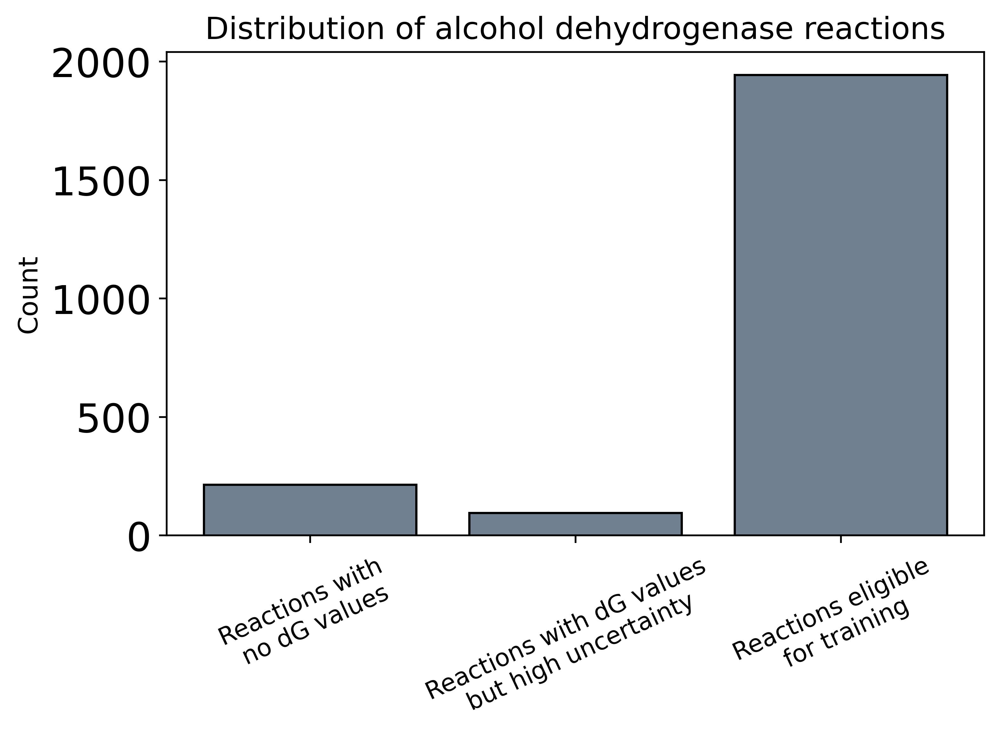

In [16]:
x_labels = ['Reactions with \nno dG values', 
            'Reactions with dG values \nbut high uncertainty', 
            'Reactions eligible \nfor training'] 

y_values = [AdH_rxns_without_cpd_accession_IDs_count, 
            AdH_rxns_not_usable_count, 
            AdH_rxns_usable_count]  # Corresponding values for each bar

# Create the plot
fig, ax = plt.subplots()  # Create a figure and a set of subplots
bars = ax.bar(x_labels, y_values, color='slategrey', edgecolor='k')  # Create a bar plot

# Set custom x-axis labels
ax.set_xticks(range(len(x_labels)))  # Set the x-ticks to match the labels
ax.set_xticklabels(x_labels, fontsize=11, rotation=25)  # Set the custom labels for the x-ticks

# Add labels and title (optional)
plt.ylabel('Count', fontsize=12)  # Y-axis label
plt.title('Distribution of alcohol dehydrogenase reactions', fontsize=14)  # Title of the graph

# Display the plot
plt.show()

Finally, let's plot the distribution of MDF values across alcohol dehydrogenase reactions in both directions at a set MDF threshold

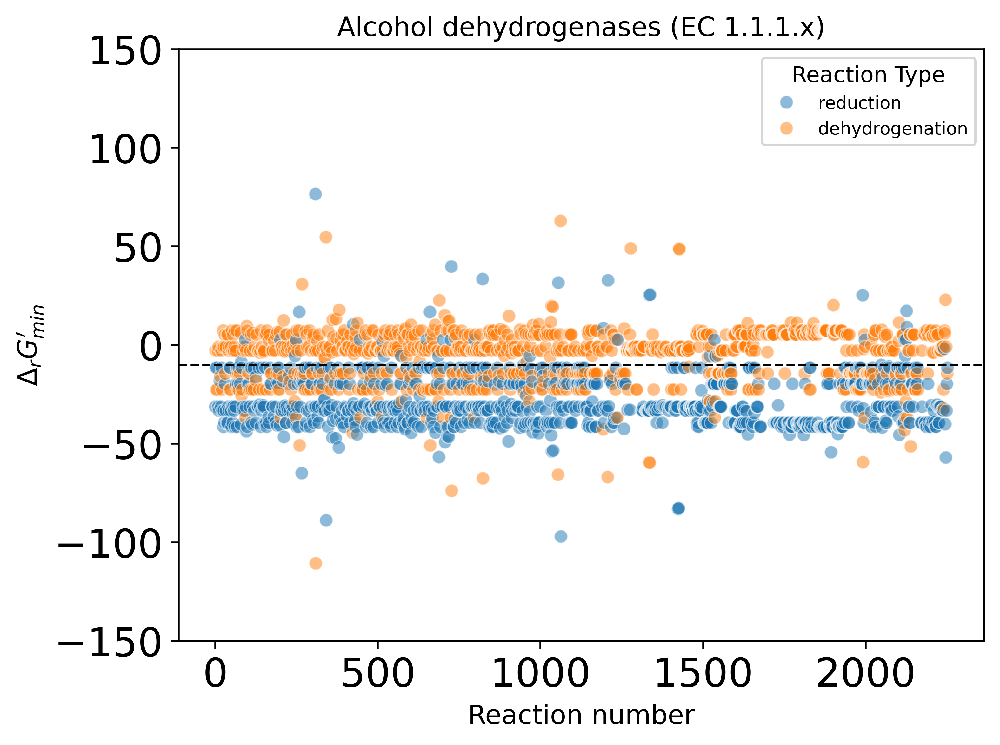

In [17]:
AdH_MDF_vals_list = []
reaction_number = []
rule_type = []

for i, rxn in enumerate(all_AdH_rxns_w_thermo):
    if rxn['Reaction ID'] in AdH_usable_rxn_IDs:
        AdH_MDF_vals_list.append(rxn['MDF'])
        reaction_number.append(i)
        rule = rxn['Rule']
        rule_type.append('dehydrogenation' if rule == 'rule0002' else 'reduction')

# Convert reaction number to a numpy array and add jitter
reaction_number_jittered = np.array(reaction_number) + np.random.normal(0, 0.1, size=len(reaction_number))

# Since MDF has the opposite sign from dG, we show dG min by taking the negative of MDF values
dG_mins_vals = [-x for x in AdH_MDF_vals_list]

# Plot using Seaborn for better handling of colors and legend
sns.scatterplot(x = reaction_number_jittered, y = dG_mins_vals, hue = rule_type, alpha=0.5)

plt.title('Alcohol dehydrogenases (EC 1.1.1.x)', fontsize=12)
plt.xlabel('Reaction number', fontsize=12)
plt.ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize=12)
plt.ylim([-150, 150])
plt.axhline(y = -10, color = 'k', linestyle = 'dashed', linewidth = 1)

plt.legend(title='Reaction Type', fontsize=8)
plt.show()

Here we see that for alcohol dehydrogenase reactions, both the reduction and the dehydrogenation directions are somewhat evenly distributed around the -10 kJ threshold

### <a id="section_2"></a> Investigating the thermodynamics of monooxygenase reactions

#### Monooxygenase reactions for which thermodynamic calculations were not even attempted

Here, we track the reaction IDs as well as the reaction IDs of monooxygenase reactions for which we did not even attempt to calculate reaction thermodynamics and driving forces with eQuilibrator. This is because of the 3 reasons we mentioned above

In [18]:
# Initialize a counter to track the number of Monox reactions for which we did not even attempt to calculate thermo
Monox_rxns_without_cpd_accession_IDs_count = 0

# store reaction IDs of Monox reactions for which we did not even attempt to calculate thermo
Monox_no_thermo_rxn_IDs = []

for rxn in all_Monox_rxns_w_thermo:
    if rxn['Reaction eq in accession IDs'] is None:
        Monox_rxns_without_cpd_accession_IDs_count += 1
        Monox_no_thermo_rxn_IDs.append(rxn['Reaction ID'])

In [19]:
print(f"\nNumber of alcohol dehydrogenase reactions for which we did not even attempt to calculate reaction thermodynamnics \neither because at least one participating compound in the reaction had incomplete SMILES (as indicated by an \nasterisk) or had atoms outside of our allowed list of atoms: {Monox_rxns_without_cpd_accession_IDs_count}")


Number of alcohol dehydrogenase reactions for which we did not even attempt to calculate reaction thermodynamnics 
either because at least one participating compound in the reaction had incomplete SMILES (as indicated by an 
asterisk) or had atoms outside of our allowed list of atoms: 78


Here, we observe the reaction strings of reactions for which we could not calculate thermodynamics with eQuilibrator:

In [20]:
for rxn in all_Monox_rxns_w_thermo:
    if rxn['Reaction eq in accession IDs'] is None:
        print(rxn['Reaction eq'])
        print('\n---------')

Oc1ccc(Cl)cc1O + O + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)c1 = Oc1cccc(Cl)c1 + O=O + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)C=CC1

---------
Oc1cccc(Cl)c1 + O=O + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)C=CC1 = Oc1ccc(Cl)cc1O + O + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)c1

---------
Oc1cccc(Cl)c1O + O + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)c1 = Oc1ccccc1Cl + O=O + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)C=CC1

---------
Oc1ccccc1Cl + O=O + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)C=CC1 = Oc1cccc(Cl)c1O + O + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(OP(=O)(O)O)C3O)C(O)C2O)c1

---------
*CC(C)=CCc1cccc(O)c1O + O + NC(=O)c1ccc[n+](C2OC

#### Monooxygenase reactions for which thermodynamic calculations WERE attempted

After filtering out reactions using the above criteria, we calculate the thermodynamic values and driving forces of the remaining monooxygenase reactions. Here as well, some more reactions need to be filtered out. For reactions wherein the error associated with thermodynamic calculations is too high, these reactions cannot be used for training purposes. This is because such high-uncertainty reactions do not have deterministic dG values, i.e. their dG values change each time they are computed

In [21]:
# Initialize counter to track the number of AdH reactions for which thermo was calculated but with high uncertainty
Monox_rxns_not_usable_count = 0

# store reaction IDs of AdH reactions for which we could calculate thermo but the uncertainty is too high
Monox_high_uncertainty_thermo_rxn_IDs = []

# initialize a counter to track the number of Monox reactions for which thermo is calculated with reasonable error
Monox_rxns_usable_count = 0

# store reaction IDs of Monox reactions which we finally use for model training/ testing
Monox_usable_rxn_IDs = []

for rxn in all_Monox_rxns_w_thermo:
    
    # consider only reactions for which thermodynamic values exist
    
    if all( [ rxn['Reaction eq in accession IDs'] is not None,
              rxn['Standard dG'] is not None ,
              rxn['Standard dG error'] is not None,
              rxn['Physiological dG'] is not None,
              rxn['Physiological dG error'] is not None ] ) : 
        
        # if the thermodynamic errors associated with a given reaction are too high, save this reaction ID
        # such reactions cannot be used for model training/ testing due to their high uncertainty
        
        if rxn['Physiological dG error'] > 9999 and rxn['Standard dG error'] > 9999:
            Monox_rxns_not_usable_count += 1
            Monox_high_uncertainty_thermo_rxn_IDs.append(rxn['Reaction ID'])
            
        # if the thermodynamic errors associated with a given reaction are reasonable, save this reaction ID
        # such reactions can be used for model training/ testing
        
        else:
            Monox_rxns_usable_count += 1
            Monox_usable_rxn_IDs.append(rxn['Reaction ID'])

In [22]:
print(f"\nNumber of monooxygenase reactions for which dG values exist but the associated error is too high: {Monox_rxns_not_usable_count}")

print(f"\nNumber of monooxygenase reactions that can be used for training: {Monox_rxns_usable_count}")


Number of monooxygenase reactions for which dG values exist but the associated error is too high: 173

Number of monooxygenase reactions that can be used for training: 1066


Here, we observe the thermodynamic values associated with *high-uncertainty reactions*

In [23]:
for rxn in all_Monox_rxns_w_thermo:
    if rxn['Reaction ID'] in Monox_high_uncertainty_thermo_rxn_IDs:
        print(f"Phsyiological dG: {rxn['Physiological dG']:.2f} +/- {rxn['Physiological dG error']}")
        print(f"Standard dG: {rxn['Standard dG']:.2f} +/- {rxn['Standard dG error']}")
        print('\n---------')

Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -62.57 +/- 100000.0
Standard dG: -45.45 +/- 100000.0

---------
Phsyiological dG: 62.57 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: 357.88 +/- 223615.65849577344
Standard dG: 374.99 +/- 223615.65849577344

---------
Phsyiological dG: -357.88 +/- 223615.65849577344
Standard dG: -374.99 +/- 223615.65849577344

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 1000

In [24]:
# Check that the total number of monooxygenase reactions is equal to the sum of:
# (1) monooxygenase reactions for which we could not even compute reaction dG values
# (2) monooxygenase reactions for which we could compute reaction dG values but at high uncertainties
# (3) monooxygenase reactions for which we could compute reaction dG values with reasonable uncertainty
# Again, only the third type of reaction cateogry can be used for model training

assert len(Monox_no_thermo_rxn_IDs) == Monox_rxns_without_cpd_accession_IDs_count
assert len(Monox_usable_rxn_IDs) == Monox_rxns_usable_count
assert len(Monox_high_uncertainty_thermo_rxn_IDs ) == Monox_rxns_not_usable_count

In [25]:
num_total_Monox_rxns = Monox_rxns_without_cpd_accession_IDs_count + Monox_rxns_usable_count + Monox_rxns_not_usable_count
assert num_total_Monox_rxns == len(all_Monox_rxns_w_thermo)

#### Visualizing monooxygenase distributions

Now, we plot the numbers of each of the above 3 categories of monooxygenase reactions

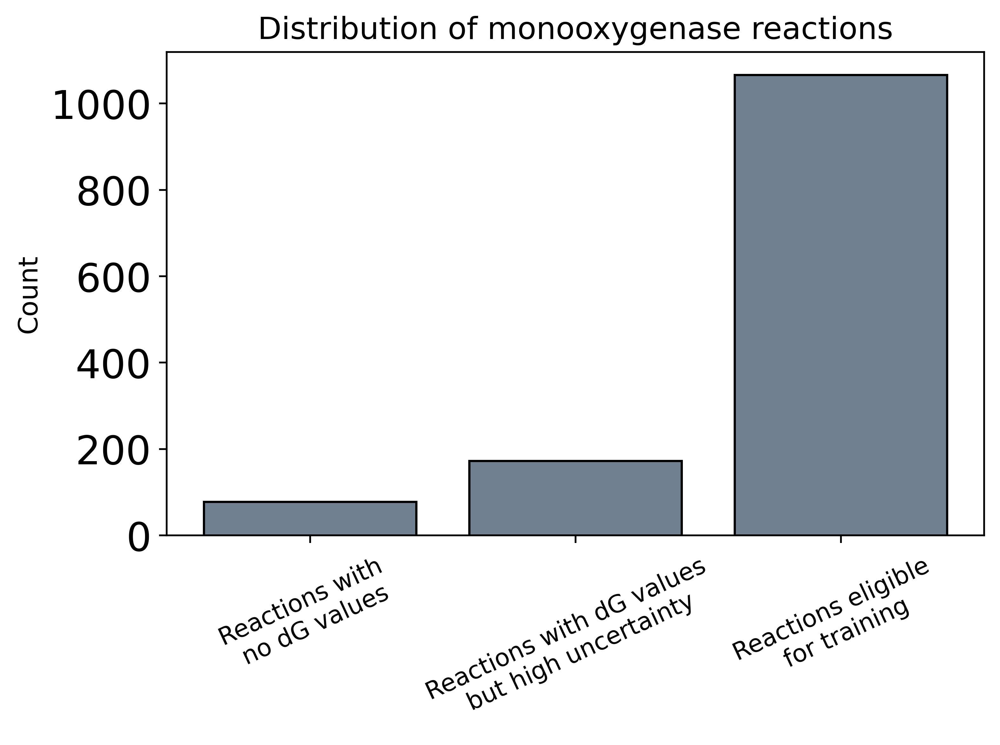

In [26]:
x_labels = ['Reactions with \nno dG values', 
            'Reactions with dG values \nbut high uncertainty', 
            'Reactions eligible \nfor training'] 

y_values = [Monox_rxns_without_cpd_accession_IDs_count, 
            Monox_rxns_not_usable_count, 
            Monox_rxns_usable_count]  # Corresponding values for each bar

# Create the plot
fig, ax = plt.subplots()  # Create a figure and a set of subplots
bars = ax.bar(x_labels, y_values, color='slategrey', edgecolor='k')  # Create a bar plot

# Set custom x-axis labels
ax.set_xticks(range(len(x_labels)))  # Set the x-ticks to match the labels
ax.set_xticklabels(x_labels, fontsize=11, rotation=25)  # Set the custom labels for the x-ticks

# Add labels and title (optional)
plt.ylabel('Count', fontsize=12)  # Y-axis label
plt.title('Distribution of monooxygenase reactions', fontsize=14)  # Title of the graph

# Display the plot
plt.show()

Finally, let's plot the distribution of MDF values across alcohol dehydrogenase reactions in both directions at a set MDF threshold

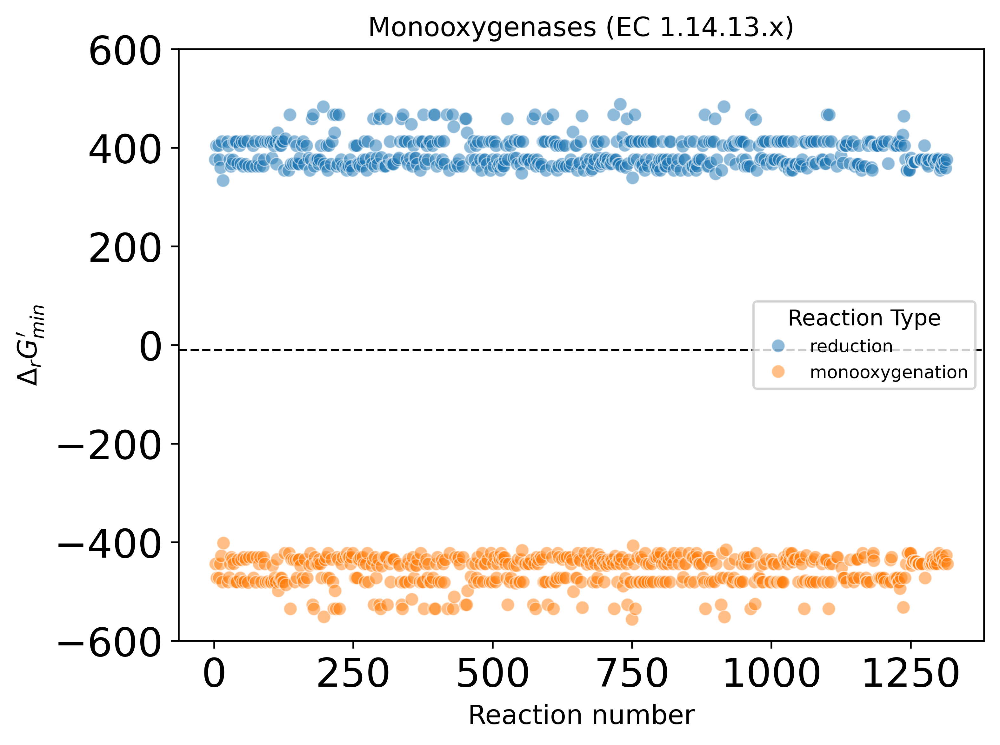

In [27]:
Monox_MDF_vals_list = []
reaction_number = []
rule_type = []

for i, rxn in enumerate(all_Monox_rxns_w_thermo):
    if rxn['Reaction ID'] in Monox_usable_rxn_IDs:
        Monox_MDF_vals_list.append(rxn['MDF'])
        reaction_number.append(i)
        rule = rxn['Rule']
        rule_type.append('monooxygenation' if rule == 'rule0004' else 'reduction')

# Convert reaction number to a numpy array and add jitter
reaction_number_jittered = np.array(reaction_number) + np.random.normal(0, 0.1, size=len(reaction_number))

# Since MDF has the opposite sign from dG, we show dG min by taking the negative of MDF values
dG_mins_vals = [-x for x in Monox_MDF_vals_list]

# Plot using Seaborn for better handling of colors and legend
sns.scatterplot(x = reaction_number_jittered, y = dG_mins_vals, hue = rule_type, alpha=0.5)

plt.title('Monooxygenases (EC 1.14.13.x)', fontsize=12)
plt.xlabel('Reaction number', fontsize=12)
plt.ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize=12)
plt.ylim([-600, 600])
plt.axhline(y = -10, color = 'k', linestyle = 'dashed', linewidth = 1)

plt.legend(title='Reaction Type', fontsize=8)
plt.show()

Here, we see that monooxygenation, which involves the reaction of O2 and NADH with a substrate, is far more thermodynamically favorable than the reverse monooxygenation or reduction direction, which involves the removal of an oxygen atom from the substrate, thereby producing O2 and NADH as products.

### <a id="section_3"></a> Investigating the thermodynamics of all processed BRENDA, KEGG, and MetaCyc reactions

#### Monooxygenase reactions for which thermodynamic calculations were NOT even attempted

Here, we track the number as well as the reaction IDs of all reactions in our database across BRENDA, KEGG, and MetaCyc for which we did not even attempt to calculate reaction thermodynamics and driving forces with eQuilibrator. As a reminder, this is because of 3 reasons: (1) at least one participating species in the reaction has an incomplete SMILES string (as indicated by an asterisk), (2) at least one participating species in the reaction has at least one atom that lies outside our allowed list of atoms (C, O, N, S, P, and H), and (3) at least one participating species cannot be decomposed into its constituent groups by eQuilibrator.

In [28]:
# Initialize a counter to track the number of reactions for which we did not even attempt to calculate thermo
all_processed_rxns_without_cpd_accession_IDs_count = 0

# store the reaction IDs of reactions for which we did not attempt to calculate thermo
all_processed_rxns_no_thermo_rxn_IDs = []


for rxn in all_processed_rxns_w_thermo:
    if rxn['Reaction eq in accession IDs'] is None:
        all_processed_rxns_without_cpd_accession_IDs_count += 1
        all_processed_rxns_no_thermo_rxn_IDs.append(rxn['Reaction ID'])

In [29]:
print(f"\nNumber of BRENDA, KEGG, MetaCyc reactions for which we did not even attempt to calculate reaction thermodynamnics \neither because at least one participating compound in the reaction had incomplete SMILES (as indicated by an \nasterisk) or had atoms outside of our allowed list of atoms: {all_processed_rxns_without_cpd_accession_IDs_count}")


Number of BRENDA, KEGG, MetaCyc reactions for which we did not even attempt to calculate reaction thermodynamnics 
either because at least one participating compound in the reaction had incomplete SMILES (as indicated by an 
asterisk) or had atoms outside of our allowed list of atoms: 4049


Here, we observe the reaction strings of reactions for which we could not calculate thermodynamics with eQuilibrator. As in the case of alcohol dehydrogenase and monooxygenation reactions, most reactions here satisfy conditions 1 and 2 above, i.e. most reactions comprise at least one participating species that has an incomplete SMILES string or at least one atom that lies outside our allowed list of atom. There also exist 4 reactions here - out of 4049 reactions that were not sent for thermodynamic calculations - that contain the molecule `CC1CO1`, which is an epoxide. This molecule does have an accession ID within eQuilibrator but for some reason still cannot be decomposed into its constituent groups. As such, the 4 reactions involving this molecule were also not sent to eQuilibrator for any thermodynamic calculations

In [30]:
for rxn in all_processed_rxns_w_thermo:
    if rxn['Reaction eq in accession IDs'] is None:
        print(rxn['Reaction ID'])
        print(rxn['Reaction eq'])
        print('\n---------')

RXN-15141
C=C(Cl)C(=O)O + O = CC(O)(Cl)C(=O)O

---------
RXN-15141_reverse
CC(O)(Cl)C(=O)O = C=C(Cl)C(=O)O + O

---------
RXN-9890
O=C(O)C(Cl)=C1C=C(Cl)C(=O)O1 + O = O=C(O)C(Cl)=CC(=O)C(Cl)C(=O)O

---------
RXN-9890_reverse
O=C(O)C(Cl)=CC(=O)C(Cl)C(=O)O = O=C(O)C(Cl)=C1C=C(Cl)C(=O)O1 + O

---------
RXN-10094
Cc1cc(Cl)c(O)c(O)c1Cl + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(O)C3O)C(O)C2O)C=CC1 = CC1=C(Cl)C(O)C(O)C(Cl)=C1 + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(O)C3O)C(O)C2O)c1

---------
RXN-10094_reverse
CC1=C(Cl)C(O)C(O)C(Cl)=C1 + NC(=O)c1ccc[n+](C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(O)C3O)C(O)C2O)c1 = Cc1cc(Cl)c(O)c(O)c1Cl + NC(=O)C1=CN(C2OC(COP(=O)(O)OP(=O)(O)OCC3OC(n4cnc5c(N)ncnc54)C(O)C3O)C(O)C2O)C=CC1

---------
UDPACYLGLCNACDEACETYL-RXN
CC(=O)O + CCCCCCCCCCCC(O)CC(=O)OC1C(N)C(OP(=O)(O)OP(=O)(O)OCC2OC(n3ccc(=O)[nH]c3=O)C(O)C2O)OC(CO)C1O = CCCCCCCCCCCC(O)CC(=O)OC1C(O)C(CO)OC(OP(=O)(O)OP(=O)(O)OCC2OC(n3ccc(=O)[nH]c3=O)C(O)

#### Processed BRENDA, KEGG, and MetaCyc reactions for which thermodynamic calculations WERE attempted

After filtering out reactions using the above three criteria (including removing the four reactions that contained the expoxide group), we calculate the thermodynamic values and driving forces of the remaining reactions. Here as well, some more reactions need to be filtered out. For reactions wherein the error associated with thermodynamic calculations is too high, these reactions cannot be used for training purposes. This is because such high-uncertainty reactions do not have deterministic dG values, i.e. their dG values change each time we compute them.

In [31]:
# Initialize counter to track total number of reactions for which thermo was calculated but with high uncertainty
all_rxns_not_usable_count = 0

# store reaction IDs of all reactions for which we could calculate thermo but the uncertainty is too high
all_rxns_high_uncertainty_thermo_IDs = []

# initialize a counter to track total number of reactions for which thermo was calculated but with reasonable error
all_rxns_usable_count = 0

# store reaction IDs of all reactions which we finally use for model training/ testing
all_usable_rxn_IDs = []

for rxn in all_processed_rxns_w_thermo:
    
    # consider only reactions for which thermodynamic values exist
    if all( [ rxn['Reaction eq in accession IDs'] is not None,
              rxn['Standard dG'] is not None ,
              rxn['Standard dG error'] is not None,
              rxn['Physiological dG'] is not None,
              rxn['Physiological dG error'] is not None ] ) : 
        
        # if the thermodynamic errors associated with a given reaction are too high, save this reaction ID
        # such reactions cannot be used for model training and testing due to their high uncertainty
        
        if rxn['Physiological dG error'] > 9999 and rxn['Standard dG error'] > 9999:
            all_rxns_not_usable_count += 1
            all_rxns_high_uncertainty_thermo_IDs.append(rxn['Reaction ID'])
        
        # if the thermodynamic errors associated with a given reaction are reasonable, save this reaction 
        # such reactions can be used for model training/ testing
        
        else:
            all_rxns_usable_count += 1
            all_usable_rxn_IDs.append(rxn['Reaction ID'])

In [32]:
print(f"\nNumber of all reactions for which dG values exist but the associated error is too high: {all_rxns_not_usable_count}")

print(f"\nNumber of all reactions that can be used for training: {all_rxns_usable_count}")


Number of all reactions for which dG values exist but the associated error is too high: 8173

Number of all reactions that can be used for training: 22831


Here, we observe the thermodynamic values associated with *high-uncertainty reactions*

In [33]:
for rxn in all_processed_rxns_w_thermo:
    if rxn['Reaction ID'] in all_rxns_high_uncertainty_thermo_IDs:
        print(f"Phsyiological dG: {rxn['Physiological dG']:.2f} +/- {rxn['Physiological dG error']}")
        print(f"Standard dG: {rxn['Standard dG']:.2f} +/- {rxn['Standard dG error']}")
        print('\n---------')

Phsyiological dG: -60.79 +/- 100000.0
Standard dG: -43.67 +/- 100000.0

---------
Phsyiological dG: 60.79 +/- 100000.0
Standard dG: 43.67 +/- 100000.0

---------
Phsyiological dG: 26.98 +/- 100005.75678559506
Standard dG: 26.98 +/- 100005.75678559506

---------
Phsyiological dG: -26.98 +/- 100005.75678559506
Standard dG: -26.98 +/- 100005.75678559506

---------
Phsyiological dG: -268.26 +/- 49655.75630100586
Standard dG: -285.37 +/- 49655.75630100586

---------
Phsyiological dG: 268.26 +/- 49655.75630100585
Standard dG: 285.37 +/- 49655.75630100585

---------
Phsyiological dG: 57.71 +/- 100000.0
Standard dG: 40.60 +/- 100000.0

---------
Phsyiological dG: -57.71 +/- 100000.0
Standard dG: -40.60 +/- 100000.0

---------
Phsyiological dG: 0.00 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 0.00 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 216.45 +/- 31403.961397309224
Standard dG: 233.57 +/- 31403.961397309224

---------
Phsyiological 

Phsyiological dG: 60.96 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.96 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -18.25 +/- 100000.0
Standard dG: -1.14 +/- 100000.0

---------
Phsyiological dG: 18.25 +/- 100000.0
Standard dG: 1.14 +/- 100000.0

---------
Phsyiological dG: 43.84 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -43.84 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 521.50 +/- 104822.07495647187
Standard dG: 538.62 +/- 104822.07495647187

---------
Phsyiological dG: -521.50 +/- 104822.07495647189
Standard dG: -538.62 +/- 104822.07495647189

---------
Phsyiological dG: -43.80 +/- 100005.94083882906
Standard dG: -43.80 +/- 100005.94083882906

---------
Phsyiological dG: 43.80 +/- 100005.94083882906
Standard dG: 43.80 +/- 100005.94083882906

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/

Phsyiological dG: -65.89 +/- 100000.0
Standard dG: -48.77 +/- 100000.0

---------
Phsyiological dG: 26.18 +/- 100012.67087877152
Standard dG: 26.18 +/- 100012.67087877152

---------
Phsyiological dG: -26.18 +/- 100012.6708787715
Standard dG: -26.18 +/- 100012.6708787715

---------
Phsyiological dG: -43.80 +/- 100005.94083882906
Standard dG: -43.80 +/- 100005.94083882906

---------
Phsyiological dG: 43.80 +/- 100005.94083882906
Standard dG: 43.80 +/- 100005.94083882906

---------
Phsyiological dG: 128.98 +/- 141425.85126183578
Standard dG: 128.98 +/- 141425.85126183578

---------
Phsyiological dG: -128.98 +/- 141425.85126183578
Standard dG: -128.98 +/- 141425.85126183578

---------
Phsyiological dG: 15.66 +/- 100005.82735162387
Standard dG: 15.66 +/- 100005.82735162387

---------
Phsyiological dG: -15.66 +/- 100005.82735162388
Standard dG: -15.66 +/- 100005.82735162388

---------
Phsyiological dG: -17.11 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 17.11 +/- 

Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -6.47 +/- 100000.0
Standard dG: -6.47 +/- 100000.0

---------
Phsyiological dG: 6.47 +/- 100000.0
Standard dG: 6.47 +/- 100000.0

---------
Phsyiological dG: 11.82 +/- 100004.0761748713
Standard dG: 11.82 +/- 100004.0761748713

---------
Phsyiological dG: -11.82 +/- 100004.0761748713
Standard dG: -11.82 +/- 100004.0761748713

---------
Phsyiological dG: 11.54 +/- 100004.0761748713
Standard dG: 11.54 +/- 100004.0761748713

---------
Phsyiological dG: -11.54 +/- 100004.0761748713
Standard dG: -11.54 +/- 100004.0761748713

---------
Phsyiological dG: 61.15 +/- 100000.0
Standard dG: 44.03 +/- 100000.0

---------
Phsyiological dG: -61.15 +/- 100000.0
Standard dG: -44.03 +/- 100000.0

---------
Phsyiological dG: 0.13 +/- 100000.0
Standard dG: 0.13 +/- 100000.0

---------
Phsyiological dG: -0.13 +/- 100000.0
Standar

Phsyiological dG: 60.88 +/- 100000.0
Standard dG: 43.76 +/- 100000.0

---------
Phsyiological dG: -60.88 +/- 100000.0
Standard dG: -43.76 +/- 100000.0

---------
Phsyiological dG: 403.69 +/- 122478.3020460552
Standard dG: 403.69 +/- 122478.3020460552

---------
Phsyiological dG: -403.69 +/- 122478.3020460552
Standard dG: -403.69 +/- 122478.3020460552

---------
Phsyiological dG: 10.80 +/- 100004.0761748713
Standard dG: 10.80 +/- 100004.0761748713

---------
Phsyiological dG: -10.80 +/- 100004.0761748713
Standard dG: -10.80 +/- 100004.0761748713

---------
Phsyiological dG: -26.76 +/- 100005.73791990663
Standard dG: -26.76 +/- 100005.73791990663

---------
Phsyiological dG: 26.76 +/- 100005.73791990663
Standard dG: 26.76 +/- 100005.73791990663

---------
Phsyiological dG: 0.14 +/- 100000.0
Standard dG: 0.14 +/- 100000.0

---------
Phsyiological dG: -0.14 +/- 100000.0
Standard dG: -0.14 +/- 100000.0

---------
Phsyiological dG: 510.33 +/- 209636.3245552347
Standard dG: 510.33 +/- 209636.

Phsyiological dG: 1.29 +/- 100000.0
Standard dG: 1.29 +/- 100000.0

---------
Phsyiological dG: -1.29 +/- 100000.0
Standard dG: -1.29 +/- 100000.0

---------
Phsyiological dG: 71.59 +/- 100000.0
Standard dG: 54.47 +/- 100000.0

---------
Phsyiological dG: -71.59 +/- 100000.0
Standard dG: -54.47 +/- 100000.0

---------
Phsyiological dG: 216.02 +/- 100004.7478294931
Standard dG: 216.02 +/- 100004.7478294931

---------
Phsyiological dG: -216.02 +/- 100004.7478294931
Standard dG: -216.02 +/- 100004.7478294931

---------
Phsyiological dG: -239.56 +/- 104826.66250533205
Standard dG: -239.56 +/- 104826.66250533205

---------
Phsyiological dG: 239.56 +/- 104826.66250533205
Standard dG: 239.56 +/- 104826.66250533205

---------
Phsyiological dG: 59.39 +/- 100000.0
Standard dG: 42.28 +/- 100000.0

---------
Phsyiological dG: -59.39 +/- 100000.0
Standard dG: -42.28 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 

Phsyiological dG: 361.86 +/- 62807.67880703375
Standard dG: 361.86 +/- 62807.67880703375

---------
Phsyiological dG: -361.86 +/- 62807.67880703375
Standard dG: -361.86 +/- 62807.67880703375

---------
Phsyiological dG: 313.84 +/- 62809.806627259466
Standard dG: 296.72 +/- 62809.806627259466

---------
Phsyiological dG: -313.84 +/- 62809.806627259466
Standard dG: -296.72 +/- 62809.806627259466

---------
Phsyiological dG: 60.96 +/- 100000.0
Standard dG: 43.85 +/- 100000.0

---------
Phsyiological dG: -60.96 +/- 100000.0
Standard dG: -43.85 +/- 100000.0

---------
Phsyiological dG: -43.84 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 43.84 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -45.00 +/- 100005.94083882906
Standard dG: -45.00 +/- 100005.94083882906

---------
Phsy

Phsyiological dG: -22.78 +/- 100006.8986900178
Standard dG: -22.78 +/- 100006.8986900178

---------
Phsyiological dG: 22.78 +/- 100006.8986900178
Standard dG: 22.78 +/- 100006.8986900178

---------
Phsyiological dG: 42.18 +/- 100000.0
Standard dG: 42.18 +/- 100000.0

---------
Phsyiological dG: -42.18 +/- 100000.0
Standard dG: -42.18 +/- 100000.0

---------
Phsyiological dG: 149.77 +/- 154757.1607309188
Standard dG: 149.77 +/- 154757.1607309188

---------
Phsyiological dG: -149.77 +/- 154757.1607309188
Standard dG: -149.77 +/- 154757.1607309188

---------
Phsyiological dG: 11.57 +/- 100004.0761748713
Standard dG: 11.57 +/- 100004.0761748713

---------
Phsyiological dG: -11.57 +/- 100004.0761748713
Standard dG: -11.57 +/- 100004.0761748713

---------
Phsyiological dG: -54.27 +/- 100000.0
Standard dG: -54.27 +/- 100000.0

---------
Phsyiological dG: 54.27 +/- 100000.0
Standard dG: 54.27 +/- 100000.0

---------
Phsyiological dG: 738.53 +/- 62807.6731660984
Standard dG: 755.65 +/- 62807.67

Phsyiological dG: -43.85 +/- 100000.0
Standard dG: -43.85 +/- 100000.0

---------
Phsyiological dG: 43.85 +/- 100000.0
Standard dG: 43.85 +/- 100000.0

---------
Phsyiological dG: 289.12 +/- 70714.06673613508
Standard dG: 289.12 +/- 70714.06673613508

---------
Phsyiological dG: -289.12 +/- 70714.06673613508
Standard dG: -289.12 +/- 70714.06673613508

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: 17.14 +/- 100000.0
Standard dG: 0.02 +/- 100000.0

---------
Phsyiological dG: -17.14 +/- 100000.0
Standard dG: -0.02 +/- 100000.0

---------
Phsyiological dG: 11.52 +/- 100004.0761748713
Standard dG: 11.52 +/- 100004.0761748713

---------
Phsyiological dG: -11.52 +/- 100004.07617487131
Standard dG: -11.52 +/- 100004.07617487131

---------
Phsyiological dG: 48.69 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -48.69 +/- 10000

Phsyiological dG: -0.00 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 0.00 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 59.54 +/- 100000.0
Standard dG: 42.43 +/- 100000.0

---------
Phsyiological dG: -59.54 +/- 100000.0
Standard dG: -42.43 +/- 100000.0

---------
Phsyiological dG: 27.80 +/- 100000.0
Standard dG: 44.92 +/- 100000.0

---------
Phsyiological dG: -27.80 +/- 100000.0
Standard dG: -44.92 +/- 100000.0

---------
Phsyiological dG: 248.60 +/- 70714.2029725181
Standard dG: 248.60 +/- 70714.2029725181

---------
Phsyiological dG: -248.60 +/- 70714.2029725181
Standard dG: -248.60 +/- 70714.2029725181

---------
Phsyiological dG: 11.72 +/- 100004.0761748713
Standard dG: 11.72 +/- 100004.0761748713

---------
Phsyiological dG: -11.72 +/- 100004.07617487131
Standard dG: -11.72 +/- 100004.07617487131

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
St

Phsyiological dG: 11.82 +/- 100004.0761748713
Standard dG: 11.82 +/- 100004.0761748713

---------
Phsyiological dG: -11.82 +/- 100004.0761748713
Standard dG: -11.82 +/- 100004.0761748713

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: -175.90 +/- 70715.89747448915
Standard dG: -193.02 +/- 70715.89747448915

---------
Phsyiological dG: 175.90 +/- 70715.89747448915
Standard dG: 193.02 +/- 70715.89747448915

---------
Phsyiological dG: 60.96 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.96 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -44.86 +/- 100005.94083882906
Standard dG: -44.86 +/- 100005.94083882906

---------
Phsyiological 

Phsyiological dG: -11.40 +/- 100004.07617487131
Standard dG: -11.40 +/- 100004.07617487131

---------
Phsyiological dG: -24.26 +/- 100005.81582660603
Standard dG: -24.26 +/- 100005.81582660603

---------
Phsyiological dG: 24.26 +/- 100005.81582660603
Standard dG: 24.26 +/- 100005.81582660603

---------
Phsyiological dG: 160.25 +/- 100004.93481232515
Standard dG: 160.25 +/- 100004.93481232515

---------
Phsyiological dG: -160.25 +/- 100004.93481232515
Standard dG: -160.25 +/- 100004.93481232515

---------
Phsyiological dG: 11.50 +/- 100004.0761748713
Standard dG: 11.50 +/- 100004.0761748713

---------
Phsyiological dG: -11.50 +/- 100004.07617487131
Standard dG: -11.50 +/- 100004.07617487131

---------
Phsyiological dG: 15.44 +/- 100004.0761748713
Standard dG: 15.44 +/- 100004.0761748713

---------
Phsyiological dG: -15.44 +/- 100004.0761748713
Standard dG: -15.44 +/- 100004.0761748713

---------
Phsyiological dG: 59.35 +/- 100000.0
Standard dG: 42.24 +/- 100000.0

---------
Phsyiologica

Phsyiological dG: 718.42 +/- 62811.928915443066
Standard dG: 735.53 +/- 62811.928915443066

---------
Phsyiological dG: -718.42 +/- 62811.928915443066
Standard dG: -735.53 +/- 62811.928915443066

---------
Phsyiological dG: -16.87 +/- 100000.0
Standard dG: 0.25 +/- 100000.0

---------
Phsyiological dG: 16.87 +/- 100000.0
Standard dG: -0.25 +/- 100000.0

---------
Phsyiological dG: 53.90 +/- 100005.8059566494
Standard dG: 36.79 +/- 100005.8059566494

---------
Phsyiological dG: -53.90 +/- 100005.8059566494
Standard dG: -36.79 +/- 100005.8059566494

---------
Phsyiological dG: -125.21 +/- 100008.87604990033
Standard dG: -125.21 +/- 100008.87604990033

---------
Phsyiological dG: 125.21 +/- 100008.87604990033
Standard dG: 125.21 +/- 100008.87604990033

---------
Phsyiological dG: 59.32 +/- 100000.0
Standard dG: 42.20 +/- 100000.0

---------
Phsyiological dG: -59.32 +/- 100000.0
Standard dG: -42.20 +/- 100000.0

---------
Phsyiological dG: 527.08 +/- 116595.76222762153
Standard dG: 509.96 

Phsyiological dG: 358.02 +/- 100009.29314579282
Standard dG: 358.02 +/- 100009.29314579282

---------
Phsyiological dG: -358.02 +/- 100009.29314579282
Standard dG: -358.02 +/- 100009.29314579282

---------
Phsyiological dG: -3.20 +/- 100007.03675495024
Standard dG: -3.20 +/- 100007.03675495024

---------
Phsyiological dG: 3.20 +/- 100007.03675495027
Standard dG: 3.20 +/- 100007.03675495027

---------
Phsyiological dG: 42.23 +/- 100000.0
Standard dG: 42.23 +/- 100000.0

---------
Phsyiological dG: -42.23 +/- 100000.0
Standard dG: -42.23 +/- 100000.0

---------
Phsyiological dG: 494.50 +/- 31411.510921663204
Standard dG: 511.62 +/- 31411.510921663204

---------
Phsyiological dG: -494.50 +/- 31411.510921663204
Standard dG: -511.62 +/- 31411.510921663204

---------
Phsyiological dG: 48.67 +/- 100000.0
Standard dG: 48.67 +/- 100000.0

---------
Phsyiological dG: -48.67 +/- 100000.0
Standard dG: -48.67 +/- 100000.0

---------
Phsyiological dG: -43.80 +/- 100005.94083882906
Standard dG: -43.8

Phsyiological dG: -24.26 +/- 100005.81582660603
Standard dG: -24.26 +/- 100005.81582660603

---------
Phsyiological dG: 24.26 +/- 100005.81582660603
Standard dG: 24.26 +/- 100005.81582660603

---------
Phsyiological dG: -370.36 +/- 62811.72543654498
Standard dG: -370.36 +/- 62811.72543654498

---------
Phsyiological dG: 370.36 +/- 62811.72543654499
Standard dG: 370.36 +/- 62811.72543654499

---------
Phsyiological dG: 215.35 +/- 70714.25151042239
Standard dG: 215.35 +/- 70714.25151042239

---------
Phsyiological dG: -215.35 +/- 70714.25151042239
Standard dG: -215.35 +/- 70714.25151042239

---------
Phsyiological dG: 60.96 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.96 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -232.32 +/- 100006.56048519103
Standard dG: -249.43 +/- 100006.56048519103

---------
Phsyiological dG: 232.32 +/- 100006.56048519103
Standard dG: 249.43 +/- 100006.56048519103

---------
Phsyiological dG: 62.96 +/

Phsyiological dG: -0.01 +/- 100000.0
Standard dG: -0.01 +/- 100000.0

---------
Phsyiological dG: 24.80 +/- 100010.30861595027
Standard dG: 24.80 +/- 100010.30861595027

---------
Phsyiological dG: -24.80 +/- 100010.30861595029
Standard dG: -24.80 +/- 100010.30861595029

---------
Phsyiological dG: 60.82 +/- 100000.0
Standard dG: 43.71 +/- 100000.0

---------
Phsyiological dG: -60.82 +/- 100000.0
Standard dG: -43.71 +/- 100000.0

---------
Phsyiological dG: 117.48 +/- 104824.1313253996
Standard dG: 117.48 +/- 104824.1313253996

---------
Phsyiological dG: -117.48 +/- 104824.1313253996
Standard dG: -117.48 +/- 104824.1313253996

---------
Phsyiological dG: 62.58 +/- 100000.0
Standard dG: 45.46 +/- 100000.0

---------
Phsyiological dG: -62.58 +/- 100000.0
Standard dG: -45.46 +/- 100000.0

---------
Phsyiological dG: 2.02 +/- 100006.22112025194
Standard dG: 2.02 +/- 100006.22112025194

---------
Phsyiological dG: -2.02 +/- 100006.22112025194
Standard dG: -2.02 +/- 100006.22112025194

----

Phsyiological dG: 253.97 +/- 62810.63030824916
Standard dG: 253.97 +/- 62810.63030824916

---------
Phsyiological dG: -253.97 +/- 62810.63030824916
Standard dG: -253.97 +/- 62810.63030824916

---------
Phsyiological dG: -41.25 +/- 100010.13389840824
Standard dG: -41.25 +/- 100010.13389840824

---------
Phsyiological dG: 41.25 +/- 100010.13389840824
Standard dG: 41.25 +/- 100010.13389840824

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: -71.59 +/- 100000.0
Standard dG: -54.47 +/- 100000.0

---------
Phsyiological dG: -10.47 +/- 100000.0
Standard dG: -10.47 +/- 100000.0

---------
Phsyiological dG: 10.47 +/- 100000.0
Standard dG: 10.47 +/- 100000.0

---------
Phsyiological dG: -65.93 +/- 1

Phsyiological dG: -306.81 +/- 62811.03459664566
Standard dG: -306.81 +/- 62811.03459664566

---------
Phsyiological dG: 306.81 +/- 62811.03459664566
Standard dG: 306.81 +/- 62811.03459664566

---------
Phsyiological dG: 178.87 +/- 100005.31884221903
Standard dG: 178.87 +/- 100005.31884221903

---------
Phsyiological dG: -178.87 +/- 100005.31884221903
Standard dG: -178.87 +/- 100005.31884221903

---------
Phsyiological dG: 39.54 +/- 100000.0
Standard dG: 39.54 +/- 100000.0

---------
Phsyiological dG: -39.54 +/- 100000.0
Standard dG: -39.54 +/- 100000.0

---------
Phsyiological dG: 207.07 +/- 31405.77479520703
Standard dG: 207.07 +/- 31405.77479520703

---------
Phsyiological dG: -207.07 +/- 31405.774795207028
Standard dG: -207.07 +/- 31405.774795207028

---------
Phsyiological dG: 1.27 +/- 100005.81191691592
Standard dG: 1.27 +/- 100005.81191691592

---------
Phsyiological dG: -1.27 +/- 100005.81191691592
Standard dG: -1.27 +/- 100005.81191691592

---------
Phsyiological dG: 11.67 +/- 

Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -218.99 +/- 70715.62938149642
Standard dG: -218.99 +/- 70715.62938149642

---------
Phsyiological dG: 218.99 +/- 70715.62938149643
Standard dG: 218.99 +/- 70715.62938149643

---------
Phsyiological dG: 106.28 +/- 154757.8518381174
Standard dG: 106.28 +/- 154757.8518381174

---------
Phsyiological dG: -106.28 +/- 154757.8518381174
Standard dG: -106.28 +/- 154757.8518381174

---------
Phsyiological dG: 3.86 +/- 100000.0
Standard dG: 3.86 +/- 100000.0

---------
Phsyiological dG: -3.86 +/- 100000.0
Standard dG: -3.86 +/- 100000.0

---------
Phsyiological dG: -3.15 +/- 100007.03675495024
Standard dG: -3.15 +/- 100007.03675495024

---------
Phsyiological dG: 3.15 +/- 100007.03675495024
Standard dG: 3.15 +/- 100007.03675495024

---------
Phsyiological dG: 282.71 +/- 66080.57684863273
Standard dG: 299.82 +/- 66080.5

Phsyiological dG: 62.57 +/- 100000.0
Standard dG: 45.46 +/- 100000.0

---------
Phsyiological dG: -62.57 +/- 100000.0
Standard dG: -45.46 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.81 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -65.81 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: -246.82 +/- 70714.2029725181
Standard dG: -246.82 +/- 70714.2029725181

---------
Phsyiological dG: 246.82 +/- 70714.2029725181
Standard dG: 246.82 +/- 70714.2029725181

---------
Phsyiological dG: 372.90 +/- 62808.059322640474
Standard dG: 372.90 +/- 62808.059322640474

---------
Phsyiological dG: -372.90 +/- 62808.059322640474
Standard dG: -372.90 +/- 62808.059322640474

---------
Phsyiological dG: -16.76 +/- 100000.0
Standard dG: 0.36 +/- 100000.0

---------
Phsyiological dG: 16.76 +/- 10

Phsyiological dG: 128.87 +/- 141425.85126183578
Standard dG: 128.87 +/- 141425.85126183578

---------
Phsyiological dG: -128.87 +/- 141425.85126183578
Standard dG: -128.87 +/- 141425.85126183578

---------
Phsyiological dG: 53.91 +/- 100005.8059566494
Standard dG: 36.80 +/- 100005.8059566494

---------
Phsyiological dG: -53.91 +/- 100005.8059566494
Standard dG: -36.80 +/- 100005.8059566494

---------
Phsyiological dG: -125.21 +/- 100008.87604990033
Standard dG: -125.21 +/- 100008.87604990033

---------
Phsyiological dG: 125.21 +/- 100008.87604990033
Standard dG: 125.21 +/- 100008.87604990033

---------
Phsyiological dG: -42.52 +/- 100000.0
Standard dG: -42.52 +/- 100000.0

---------
Phsyiological dG: -7.11 +/- 100007.18086229207
Standard dG: -7.11 +/- 100007.18086229207

---------
Phsyiological dG: 7.11 +/- 100007.18086229207
Standard dG: 7.11 +/- 100007.18086229207

---------
Phsyiological dG: -106.41 +/- 100000.0
Standard dG: -89.29 +/- 100000.0

---------
Phsyiological dG: 106.41 +/

Phsyiological dG: -281.23 +/- 62809.7332849216
Standard dG: -281.23 +/- 62809.7332849216

---------
Phsyiological dG: 281.23 +/- 62809.7332849216
Standard dG: 281.23 +/- 62809.7332849216

---------
Phsyiological dG: -310.94 +/- 200011.1972601596
Standard dG: -328.06 +/- 200011.1972601596

---------
Phsyiological dG: 310.94 +/- 200011.1972601596
Standard dG: 328.06 +/- 200011.1972601596

---------
Phsyiological dG: -310.94 +/- 200011.19726015956
Standard dG: -328.06 +/- 200011.19726015956

---------
Phsyiological dG: 310.94 +/- 200011.19726015956
Standard dG: 328.06 +/- 200011.19726015956

---------
Phsyiological dG: -16.86 +/- 100000.0
Standard dG: 0.25 +/- 100000.0

---------
Phsyiological dG: 16.86 +/- 100000.0
Standard dG: -0.25 +/- 100000.0

---------
Phsyiological dG: -100.07 +/- 100000.0
Standard dG: -82.96 +/- 100000.0

---------
Phsyiological dG: 100.07 +/- 100000.0
Standard dG: 82.96 +/- 100000.0

---------
Phsyiological dG: -59.86 +/- 100000.0
Standard dG: -42.75 +/- 100000.0

Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: -0.00 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 0.00 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 17.14 +/- 100000.0
Standard dG: 0.03 +/- 100000.0

---------
Phsyiological dG: -17.14 +/- 100000.0
Standard dG: -0.03 +/- 100000.0

---------
Phsyiological dG: 65.80 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -65.80 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: -0.02 +/- 100000

Phsyiological dG: 45.45 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: -45.45 +/- 100000.0
Standard dG: -45.45 +/- 100000.0

---------
Phsyiological dG: 45.45 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: -45.45 +/- 100000.0
Standard dG: -45.45 +/- 100000.0

---------
Phsyiological dG: 45.45 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: 45.45 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: -45.45 +/- 100000.0
Standard dG: -45.45 +/- 100000.0

---------
Phsyiological dG: 131.38 +/- 100000.6334599351
Standard dG: 131.38 +/- 100000.6334599351

---------
Phsyiological dG: -131.38 +/- 100000.6334599351
Standard dG: -131.38 +/- 100000.6334599351

---------
Phsyiological dG: 45.45 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: 48.69 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -48.69 +/- 100000.0
Standard dG: -48.69 +/- 100000.0



Phsyiological dG: -45.45 +/- 100000.0
Standard dG: -45.45 +/- 100000.0

---------
Phsyiological dG: 45.45 +/- 100000.0
Standard dG: 45.45 +/- 100000.0

---------
Phsyiological dG: -48.69 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 48.69 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: 176.90 +/- 31402.63701306821
Standard dG: 176.90 +/- 31402.63701306821

---------
Phsyiological dG: -176.90 +/- 31402.637013068226
Standard dG: -176.90 +/- 31402.637013068226

---------
Phsyiological dG: -48.69 +/- 100000.0
Standard dG: -48.69 +/- 100000.0

---------
Phsyiological dG: 48.69 +/- 100000.0
Standard dG: 48.69 +/- 100000.0

---------
Phsyiological dG: -176.90 +/- 31402.637013068226
Standard dG: -176.90 +/- 31402.637013068226

---------
Phsyiological dG: 176.90 +/- 31402.63701306821
Standard dG: 176.90 +/- 31402.63701306821

---------
Phsyiological dG: -45.45 +/- 100000.0
Standard dG: -45.45 +/- 100000.0

---------
Phsyiological dG: 45.45 

Phsyiological dG: 45.91 +/- 100000.0
Standard dG: 45.91 +/- 100000.0

---------
Phsyiological dG: -45.40 +/- 100000.0
Standard dG: -45.40 +/- 100000.0

---------
Phsyiological dG: 45.40 +/- 100000.0
Standard dG: 45.40 +/- 100000.0

---------
Phsyiological dG: -89.55 +/- 100000.0
Standard dG: -89.55 +/- 100000.0

---------
Phsyiological dG: -45.91 +/- 100000.0
Standard dG: -45.91 +/- 100000.0

---------
Phsyiological dG: 89.55 +/- 100000.0
Standard dG: 89.55 +/- 100000.0

---------
Phsyiological dG: -0.00 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 0.00 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -0.00 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 0.00 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -44.10 +/- 100000.0
Standard dG: -44.10 +/- 100000.0

---------
Phsyiological dG: 44.10 +/- 100000.0
Standard dG: 44.10 +/- 100000.0

---------
Phsyiological dG: 60.96 +/- 100000.0

Phsyiological dG: -60.94 +/- 100000.0
Standard dG: -43.83 +/- 100000.0

---------
Phsyiological dG: 60.94 +/- 100000.0
Standard dG: 43.83 +/- 100000.0

---------
Phsyiological dG: -271.51 +/- 118095.03157960344
Standard dG: -254.40 +/- 118095.03157960344

---------
Phsyiological dG: 271.51 +/- 118095.03157960344
Standard dG: 254.40 +/- 118095.03157960344

---------
Phsyiological dG: 313.94 +/- 62809.806627259466
Standard dG: 296.83 +/- 62809.806627259466

---------
Phsyiological dG: 313.84 +/- 62809.806627259466
Standard dG: 296.72 +/- 62809.806627259466

---------
Phsyiological dG: -313.94 +/- 62809.806627259466
Standard dG: -296.83 +/- 62809.806627259466

---------
Phsyiological dG: -313.84 +/- 62809.806627259466
Standard dG: -296.72 +/- 62809.806627259466

---------
Phsyiological dG: 197.00 +/- 100008.56371722365
Standard dG: 197.00 +/- 100008.56371722365

---------
Phsyiological dG: -197.00 +/- 100008.56371722365
Standard dG: -197.00 +/- 100008.56371722365

---------
Phsyiological 

Phsyiological dG: 0.13 +/- 100000.0
Standard dG: 0.13 +/- 100000.0

---------
Phsyiological dG: -0.13 +/- 100000.0
Standard dG: -0.13 +/- 100000.0

---------
Phsyiological dG: 0.13 +/- 100000.0
Standard dG: 0.13 +/- 100000.0

---------
Phsyiological dG: 12.64 +/- 100007.2969470372
Standard dG: 12.64 +/- 100007.2969470372

---------
Phsyiological dG: -12.64 +/- 100007.29694703723
Standard dG: -12.64 +/- 100007.29694703723

---------
Phsyiological dG: -0.13 +/- 100000.0
Standard dG: -0.13 +/- 100000.0

---------
Phsyiological dG: -0.13 +/- 100000.0
Standard dG: -0.13 +/- 100000.0

---------
Phsyiological dG: 0.13 +/- 100000.0
Standard dG: 0.13 +/- 100000.0

---------
Phsyiological dG: 0.13 +/- 100000.0
Standard dG: 0.13 +/- 100000.0

---------
Phsyiological dG: 102.71 +/- 100005.36997893019
Standard dG: 102.71 +/- 100005.36997893019

---------
Phsyiological dG: -102.71 +/- 100005.36997893019
Standard dG: -102.71 +/- 100005.36997893019

---------
Phsyiological dG: 0.13 +/- 100000.0
Standa

Phsyiological dG: -58.76 +/- 100000.0
Standard dG: -41.65 +/- 100000.0

---------
Phsyiological dG: -55.90 +/- 100000.0
Standard dG: -38.79 +/- 100000.0

---------
Phsyiological dG: -58.69 +/- 100000.0
Standard dG: -41.58 +/- 100000.0

---------
Phsyiological dG: -58.69 +/- 100000.0
Standard dG: -41.58 +/- 100000.0

---------
Phsyiological dG: -58.68 +/- 100000.0
Standard dG: -41.56 +/- 100000.0

---------
Phsyiological dG: -60.96 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -59.84 +/- 100000.0
Standard dG: -42.73 +/- 100000.0

---------
Phsyiological dG: -60.92 +/- 100000.0
Standard dG: -43.81 +/- 100000.0

---------
Phsyiological dG: -56.91 +/- 100000.0
Standard dG: -39.79 +/- 100000.0

---------
Phsyiological dG: 59.82 +/- 100000.0
Standard dG: 42.70 +/- 100000.0

---------
Phsyiological dG: 58.99 +/- 100000.0
Standard dG: 41.88 +/- 100000.0

---------
Phsyiological dG: -60.72 +/- 100000.0
Standard dG: -43.60 +/- 100000.0

---------
Phsyiological dG: -5

Phsyiological dG: -0.62 +/- 100000.0
Standard dG: -0.62 +/- 100000.0

---------
Phsyiological dG: 0.62 +/- 100000.0
Standard dG: 0.62 +/- 100000.0

---------
Phsyiological dG: -10.47 +/- 100000.0
Standard dG: -10.47 +/- 100000.0

---------
Phsyiological dG: -10.47 +/- 100000.0
Standard dG: -10.47 +/- 100000.0

---------
Phsyiological dG: -10.47 +/- 100000.0
Standard dG: -10.47 +/- 100000.0

---------
Phsyiological dG: 10.47 +/- 100000.0
Standard dG: 10.47 +/- 100000.0

---------
Phsyiological dG: 10.47 +/- 100000.0
Standard dG: 10.47 +/- 100000.0

---------
Phsyiological dG: 10.47 +/- 100000.0
Standard dG: 10.47 +/- 100000.0

---------
Phsyiological dG: 10.47 +/- 100000.0
Standard dG: 10.47 +/- 100000.0

---------
Phsyiological dG: -10.47 +/- 100000.0
Standard dG: -10.47 +/- 100000.0

---------
Phsyiological dG: -228.56 +/- 70714.25310534767
Standard dG: -228.56 +/- 70714.25310534767

---------
Phsyiological dG: 228.56 +/- 70714.25310534766
Standard dG: 228.56 +/- 70714.25310534766

--

Phsyiological dG: 5.21 +/- 100006.10843840282
Standard dG: 5.21 +/- 100006.10843840282

---------
Phsyiological dG: 5.21 +/- 100006.10843840282
Standard dG: 5.21 +/- 100006.10843840282

---------
Phsyiological dG: 3.84 +/- 100006.1084384028
Standard dG: 3.84 +/- 100006.1084384028

---------
Phsyiological dG: 5.21 +/- 100006.10843840282
Standard dG: 5.21 +/- 100006.10843840282

---------
Phsyiological dG: 5.21 +/- 100006.10843840282
Standard dG: 5.21 +/- 100006.10843840282

---------
Phsyiological dG: 5.21 +/- 100006.10843840282
Standard dG: 5.21 +/- 100006.10843840282

---------
Phsyiological dG: 3.83 +/- 100006.1084384028
Standard dG: 3.83 +/- 100006.1084384028

---------
Phsyiological dG: 5.21 +/- 100006.10843840282
Standard dG: 5.21 +/- 100006.10843840282

---------
Phsyiological dG: 5.21 +/- 100006.10843840282
Standard dG: 5.21 +/- 100006.10843840282

---------
Phsyiological dG: 5.21 +/- 100006.10843840282
Standard dG: 5.21 +/- 100006.10843840282

---------
Phsyiological dG: 5.21 +

Phsyiological dG: 48.54 +/- 100000.0
Standard dG: 48.54 +/- 100000.0

---------
Phsyiological dG: -48.54 +/- 100000.0
Standard dG: -48.54 +/- 100000.0

---------
Phsyiological dG: 48.54 +/- 100000.0
Standard dG: 48.54 +/- 100000.0

---------
Phsyiological dG: -48.54 +/- 100000.0
Standard dG: -48.54 +/- 100000.0

---------
Phsyiological dG: 48.54 +/- 100000.0
Standard dG: 48.54 +/- 100000.0

---------
Phsyiological dG: -48.54 +/- 100000.0
Standard dG: -48.54 +/- 100000.0

---------
Phsyiological dG: -48.54 +/- 100000.0
Standard dG: -48.54 +/- 100000.0

---------
Phsyiological dG: 48.54 +/- 100000.0
Standard dG: 48.54 +/- 100000.0

---------
Phsyiological dG: -4.63 +/- 100000.0
Standard dG: -4.63 +/- 100000.0

---------
Phsyiological dG: 4.63 +/- 100000.0
Standard dG: 4.63 +/- 100000.0

---------
Phsyiological dG: 7.10 +/- 100000.0
Standard dG: 7.10 +/- 100000.0

---------
Phsyiological dG: -7.10 +/- 100000.0
Standard dG: -7.10 +/- 100000.0

---------
Phsyiological dG: 10.35 +/- 100000.0

Phsyiological dG: 246.82 +/- 70714.20297251809
Standard dG: 246.82 +/- 70714.20297251809

---------
Phsyiological dG: -246.82 +/- 70714.20297251809
Standard dG: -246.82 +/- 70714.20297251809

---------
Phsyiological dG: 246.82 +/- 70714.2029725181
Standard dG: 246.82 +/- 70714.2029725181

---------
Phsyiological dG: -246.82 +/- 70714.2029725181
Standard dG: -246.82 +/- 70714.2029725181

---------
Phsyiological dG: -0.01 +/- 100000.0
Standard dG: -0.01 +/- 100000.0

---------
Phsyiological dG: -246.82 +/- 70714.20297251809
Standard dG: -246.82 +/- 70714.20297251809

---------
Phsyiological dG: -246.82 +/- 70714.20297251809
Standard dG: -246.82 +/- 70714.20297251809

---------
Phsyiological dG: -246.82 +/- 70714.2029725181
Standard dG: -246.82 +/- 70714.2029725181

---------
Phsyiological dG: -246.82 +/- 70714.20297251809
Standard dG: -246.82 +/- 70714.20297251809

---------
Phsyiological dG: -246.82 +/- 70714.2029725181
Standard dG: -246.82 +/- 70714.2029725181

---------
Phsyiological 

Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 60.96 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 60.96 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -60.96 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 1

Phsyiological dG: 107.14 +/- 100000.0
Standard dG: 90.03 +/- 100000.0

---------
Phsyiological dG: -107.14 +/- 100000.0
Standard dG: -90.03 +/- 100000.0

---------
Phsyiological dG: -111.65 +/- 100000.0
Standard dG: -94.53 +/- 100000.0

---------
Phsyiological dG: 111.65 +/- 100000.0
Standard dG: 94.53 +/- 100000.0

---------
Phsyiological dG: 107.91 +/- 100000.0
Standard dG: 90.79 +/- 100000.0

---------
Phsyiological dG: 113.82 +/- 100000.0
Standard dG: 96.70 +/- 100000.0

---------
Phsyiological dG: -113.82 +/- 100000.0
Standard dG: -96.70 +/- 100000.0

---------
Phsyiological dG: -107.91 +/- 100000.0
Standard dG: -90.79 +/- 100000.0

---------
Phsyiological dG: 106.59 +/- 100000.0
Standard dG: 89.47 +/- 100000.0

---------
Phsyiological dG: 112.41 +/- 100000.0
Standard dG: 95.29 +/- 100000.0

---------
Phsyiological dG: -112.41 +/- 100000.0
Standard dG: -95.29 +/- 100000.0

---------
Phsyiological dG: -106.59 +/- 100000.0
Standard dG: -89.47 +/- 100000.0

---------
Phsyiological dG

Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: -17.17 +/- 100000.0
Standard dG: -0.05 +/- 100000.0

---------
Phsyiological dG: 17.17 +/- 100000.0
Standard dG: 0.05 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
St

Phsyiological dG: 0.00 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -0.00 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 17.17 +/- 100000.0
Standard dG: 0.05 +/- 100000.0

---------
Phsyiological dG: -17.17 +/- 100000.0
Standard dG: -0.05 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standar

Phsyiological dG: 59.31 +/- 100000.0
Standard dG: 42.19 +/- 100000.0

---------
Phsyiological dG: -59.31 +/- 100000.0
Standard dG: -42.19 +/- 100000.0

---------
Phsyiological dG: -59.31 +/- 100000.0
Standard dG: -42.19 +/- 100000.0

---------
Phsyiological dG: 59.31 +/- 100000.0
Standard dG: 42.19 +/- 100000.0

---------
Phsyiological dG: -59.31 +/- 100000.0
Standard dG: -42.19 +/- 100000.0

---------
Phsyiological dG: 59.31 +/- 100000.0
Standard dG: 42.19 +/- 100000.0

---------
Phsyiological dG: 59.33 +/- 100000.0
Standard dG: 42.22 +/- 100000.0

---------
Phsyiological dG: -59.33 +/- 100000.0
Standard dG: -42.22 +/- 100000.0

---------
Phsyiological dG: 59.33 +/- 100000.0
Standard dG: 42.22 +/- 100000.0

---------
Phsyiological dG: -59.33 +/- 100000.0
Standard dG: -42.22 +/- 100000.0

---------
Phsyiological dG: 59.33 +/- 100000.0
Standard dG: 42.22 +/- 100000.0

---------
Phsyiological dG: -59.33 +/- 100000.0
Standard dG: -42.22 +/- 100000.0

---------
Phsyiological dG: 59.00 +/- 

Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 61.02 +/- 100000.0
Standard dG: 43.91 +/- 100000.0

---------
Phsyiological dG: -61.02 +/- 100000.0
Standard dG: -43.91 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 106.54 +/- 100000.0
Standard dG: 89.43 +/- 100000.0

---------
Phsyiological dG: -106.54 +/- 100000.0
Standard dG: -89.43 +/- 100000.0

---------
Phsyiological dG: -56.11 +/- 100005.5079129728
Standard dG: -73.22 +/- 100005.5079129728

---------
Phsyiological dG: 56.11 +/- 100005.5079129728
Standard dG: 73.22 +/- 100005.5079129728

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0



Phsyiological dG: -106.41 +/- 100000.0
Standard dG: -89.29 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 106.41 +/- 100000.0
Standard dG: 89.29 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: -106.41 +/- 100000.0
Standard dG: -89.29 +/- 100000.0

---------
Phsyiological dG: 17.84 +/- 100000.0
Standard dG: 0.73 +/- 100000.0

---------
Phsyiological dG: -23.80 +

Phsyiological dG: 25.08 +/- 100000.0
Standard dG: 42.19 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: -25.08 +/- 100000.0
Standard dG: -42.19 +/- 100000.0

---------
Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.00 +/- 100000.0

---------
Phsyiological dG: -65.64 +/- 100000.0
Standard dG: -82.76 +/- 100000.0

---------
Phsyiological dG: -25.10 +/- 100000.0
Standard dG: -42.22 +/- 100000.0

---------
Phsyiological dG: -25.10 +/- 100000.0
Standard dG: -42.22 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.00 +/- 100000.0

---------
Phsyiological dG: 65.64 +/- 100000.0
Standard dG: 82.76 +/- 100000.0

---------
Phsyiological dG: 25.10 +/- 100000.0
Standard dG: 42.22 +/- 100000.0

---------
Phsyiological dG: 25.10 +/- 100000.0
Standard dG: 42.22 +/- 100000.0

---------
Phsyiological dG: 60.97 +/- 100000.0
Standard dG: 43.86 +/- 100000.0

---------
Phsyiological dG: -60.97 +/- 10

Phsyiological dG: 17.12 +/- 100000.0
Standard dG: 0.01 +/- 100000.0

---------
Phsyiological dG: -17.12 +/- 100000.0
Standard dG: -0.01 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: 60.95 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -60.95 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 60.05 +/- 100000.0
Standard dG: 42.94 +/- 100000.0

---------
Phsyiological dG: -60.05 +/- 100000.0
Standard dG: -42.94 +/- 100000.0

---------
Phsyiological dG: 59.85 +/- 100000.0
Standard dG: 42.74 +/- 100000.0

---------
Phsyiological dG: -59.85 +/- 100000.0
Standard dG: -42.74 +/- 100000.0

---------
Phsyiological dG: 62.17 +/- 100000.0
Standard dG: 45.06 +/- 100000.0

---------
Phsyiological dG: -62.17 +/- 100000.0
Standard dG: -45.06 +/- 100000.0

---------
Phsyiological dG: -62.58 +/- 1

Phsyiological dG: -26.69 +/- 100000.0
Standard dG: -43.80 +/- 100000.0

---------
Phsyiological dG: 26.69 +/- 100000.0
Standard dG: 43.80 +/- 100000.0

---------
Phsyiological dG: -60.96 +/- 100000.0
Standard dG: -43.84 +/- 100000.0

---------
Phsyiological dG: 60.96 +/- 100000.0
Standard dG: 43.84 +/- 100000.0

---------
Phsyiological dG: -9.57 +/- 100000.0
Standard dG: -43.80 +/- 100000.0

---------
Phsyiological dG: 9.57 +/- 100000.0
Standard dG: 43.80 +/- 100000.0

---------
Phsyiological dG: -9.52 +/- 100000.0
Standard dG: -43.75 +/- 100000.0

---------
Phsyiological dG: -9.57 +/- 100000.0
Standard dG: -43.80 +/- 100000.0

---------
Phsyiological dG: -9.20 +/- 100000.0
Standard dG: -43.43 +/- 100000.0

---------
Phsyiological dG: -9.58 +/- 100000.0
Standard dG: -43.81 +/- 100000.0

---------
Phsyiological dG: -9.56 +/- 100000.0
Standard dG: -43.79 +/- 100000.0

---------
Phsyiological dG: 9.57 +/- 100000.0
Standard dG: 43.80 +/- 100000.0

---------
Phsyiological dG: 9.52 +/- 10000

Phsyiological dG: 153.85 +/- 100004.92947757467
Standard dG: 170.97 +/- 100004.92947757467

---------
Phsyiological dG: -153.85 +/- 100004.92947757467
Standard dG: -170.97 +/- 100004.92947757467

---------
Phsyiological dG: -153.85 +/- 100004.92947757467
Standard dG: -170.97 +/- 100004.92947757467

---------
Phsyiological dG: -153.44 +/- 100004.92947757467
Standard dG: -170.55 +/- 100004.92947757467

---------
Phsyiological dG: -153.85 +/- 100004.92947757467
Standard dG: -170.97 +/- 100004.92947757467

---------
Phsyiological dG: -153.85 +/- 100004.92947757467
Standard dG: -170.97 +/- 100004.92947757467

---------
Phsyiological dG: -17.25 +/- 100000.0
Standard dG: -0.13 +/- 100000.0

---------
Phsyiological dG: 153.85 +/- 100004.92947757467
Standard dG: 170.97 +/- 100004.92947757467

---------
Phsyiological dG: 153.85 +/- 100004.92947757467
Standard dG: 170.97 +/- 100004.92947757467

---------
Phsyiological dG: 153.85 +/- 100004.92947757467
Standard dG: 170.97 +/- 100004.92947757467

-

Phsyiological dG: -77.86 +/- 100000.0
Standard dG: -43.63 +/- 100000.0

---------
Phsyiological dG: 77.86 +/- 100000.0
Standard dG: 43.63 +/- 100000.0

---------
Phsyiological dG: 77.86 +/- 100000.0
Standard dG: 43.63 +/- 100000.0

---------
Phsyiological dG: -77.86 +/- 100000.0
Standard dG: -43.63 +/- 100000.0

---------
Phsyiological dG: -60.20 +/- 100000.0
Standard dG: -43.08 +/- 100000.0

---------
Phsyiological dG: 17.38 +/- 100000.0
Standard dG: 0.26 +/- 100000.0

---------
Phsyiological dG: 60.20 +/- 100000.0
Standard dG: 43.08 +/- 100000.0

---------
Phsyiological dG: -17.38 +/- 100000.0
Standard dG: -0.26 +/- 100000.0

---------
Phsyiological dG: 235.24 +/- 70715.22111481056
Standard dG: 218.12 +/- 70715.22111481056

---------
Phsyiological dG: -235.24 +/- 70715.22111481056
Standard dG: -218.12 +/- 70715.22111481056

---------
Phsyiological dG: -235.24 +/- 70715.22111481054
Standard dG: -218.12 +/- 70715.22111481054

---------
Phsyiological dG: 235.24 +/- 70715.22111481054
Sta

In [34]:
# Check that the total number of reactions is equal to the sum of:
# (1) reactions for which we could not even compute reaction dG values
# (2) reactions for which we could compute reaction dG values but at high uncertainties
# (3) reactions for which we could compute reaction dG values with reasonable uncertainty
# Again, only the third type of reaction cateogry can be used for model training

assert len(all_processed_rxns_no_thermo_rxn_IDs) == all_processed_rxns_without_cpd_accession_IDs_count
assert len(all_rxns_high_uncertainty_thermo_IDs) == all_rxns_not_usable_count
assert len(all_usable_rxn_IDs) == all_rxns_usable_count

In [35]:
# The total number of reactions we send to eQuilibrator for thermodynamic calculations is 35,065
# The total number of reactions which we recieve out of eQuilibrator, however, is 35,053
# This discrepancy arises from our removal of certain reactions which prevented thermodynamic calculations
# Such reactions were only found when we tried to compute the thermodynamics for all reactions in parallel
4049 + 8173 + 22831

35053

#### Visualizing the distributions of all processed reactions across BRENDA, KEGG, and MetaCyc

Now, we plot the numbers of each of the above 3 categories of monooxygenase reactions

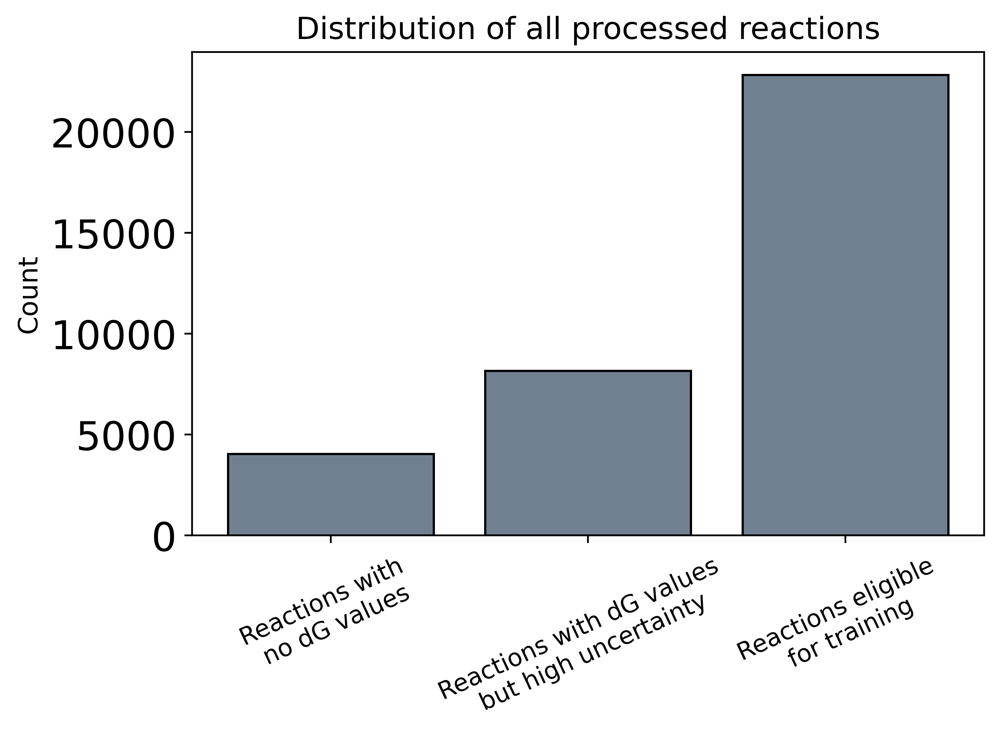

In [36]:
x_labels = ['Reactions with \nno dG values', 
            'Reactions with dG values \nbut high uncertainty', 
            'Reactions eligible \nfor training'] 

y_values = [all_processed_rxns_without_cpd_accession_IDs_count, 
            all_rxns_not_usable_count, 
            all_rxns_usable_count]  # Corresponding values for each bar

# Create the plot
fig, ax = plt.subplots()  # Create a figure and a set of subplots
bars = ax.bar(x_labels, y_values, color='slategrey', edgecolor='k')  # Create a bar plot

# Set custom x-axis labels
ax.set_xticks(range(len(x_labels)))  # Set the x-ticks to match the labels
ax.set_xticklabels(x_labels, fontsize=11, rotation=25)  # Set the custom labels for the x-ticks

# Add labels and title (optional)
plt.ylabel('Count', fontsize=12)  # Y-axis label
plt.title('Distribution of all processed reactions', fontsize=14)  # Title of the graph

# Display the plot
plt.show()

### <a id="section_4"></a>Investigating the counts of reactions per reaction rule

Finally, let's examine the total number of reactions per reaction rule. Recall that reaction rules are ordered by popularity, i.e. rules that appear earlier in our reaction rules database were mapped to more reactions than rules which appeared later.

In [37]:
def get_rxn_counts_per_rxn_rule(query_rule, all_processed_rxns_w_thermo, usable_rxn_IDs):
    rxn_counts = 0
    for rxn in all_processed_rxns_w_thermo:
        if rxn['Reaction ID'] in usable_rxn_IDs:
            if rxn['Rule'] == query_rule:
                rxn_counts += 1
    return rxn_counts

In [38]:
def get_all_rule_counts(all_processed_rxns_w_thermo, usable_rxn_IDs):
    all_rules_list = []
    for rxn in all_processed_rxns_w_thermo:
        if rxn['Reaction ID'] in usable_rxn_IDs:
            all_rules_list.append(rxn['Rule'])
    return all_rules_list

In [39]:
all_rxn_rules = get_all_rule_counts(all_processed_rxns_w_thermo, all_usable_rxn_IDs)

In [40]:
rule_counts = dict(Counter(all_rxn_rules))

In [41]:
sorted_rule_counts = {k: v for k, v in sorted(rule_counts.items(), key=lambda item: item[0])}

In [42]:
rule_numbers = [int(re.findall(r'\d+', rule)[0]) for rule in list(sorted_rule_counts.keys())]

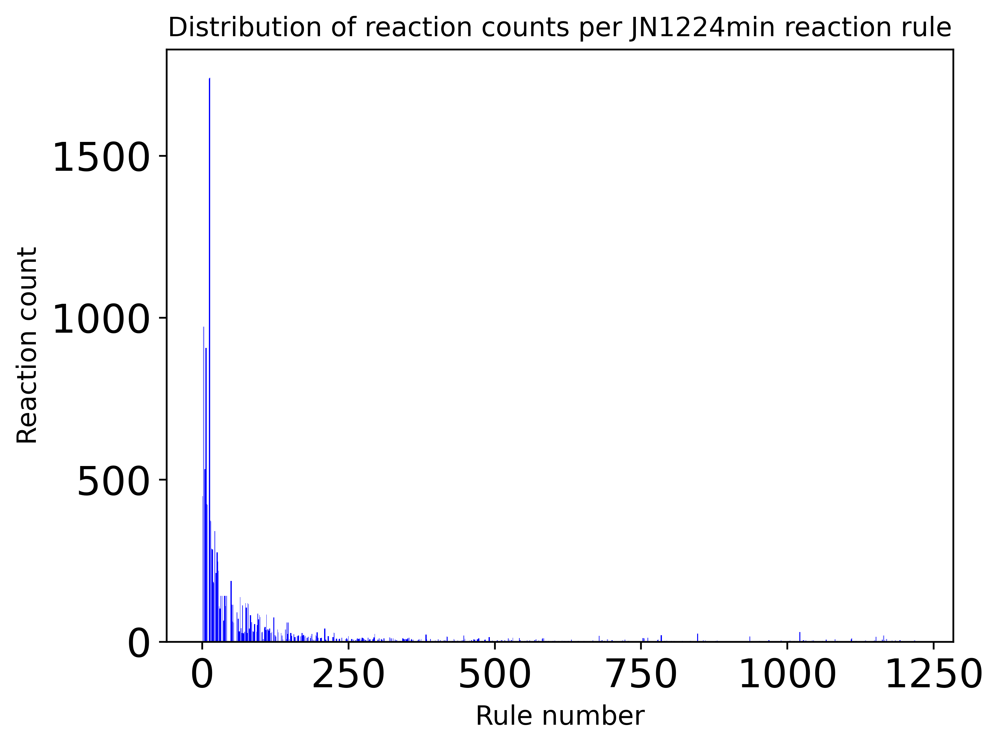

In [43]:
plt.bar(rule_numbers , list(sorted_rule_counts.values()), color='blue')
plt.xlabel('Rule number', fontsize = 12)
plt.ylabel('Reaction count', fontsize = 12)
plt.title('Distribution of reaction counts per JN1224min reaction rule',fontsize = 12);

### <a id="section_5"></a>Investigating the MDF distributions of various classes of reactions (SI figure)

When comparing alcohol dehydrogenase reactions and monooxygenase reactions that were processed individually against those that were processed from the combined, unique list of BRENDA, KEGG, and MetaCyc reactions, it appears that there are slight difference in the total number of reactions for each category when processed individually vs when processed together. Reassuringly, the total number of reactions that are indeed eligible for training is the same in both approaches but the number of ineligible reactions is slightly different. I am not too sure why this difference arose but given that it only affects the number of ineligible reactions that will not be used for training anyway, it should not be a hinderance.

In [44]:
def get_MDF_vals(query_rules, rxn_types, all_processed_rxns_w_thermo):
    
    rxn_count = 0
    MDF_vals_list = []
    reaction_number_list = []
    rule_type = []

    # consider all processed reactions
    for rxn in all_processed_rxns_w_thermo:

        # if the reaction rule that a particular reaction has been mapped to falls within the query rules list
        if rxn['Rule'] in query_rules:
            
            # and if this particular reaction was sent to eQuilibrator for thermodynamic calculations
            if rxn['Reaction eq in accession IDs'] is not None:
                
                # and if this reaction had a reasonable dG error
                if rxn['Physiological dG error'] <= 9999 and rxn['Standard dG error'] <= 9999:

                    MDF_vals_list.append(rxn['MDF'])
                    rxn_count += 1
                    reaction_number_list.append(rxn_count)

                    # store the reaction type depending on the query rules
                    # e.g. if query_rules = ['rule0004','rule0005'] and rxn_types = ['monooxygenation','reduction']
                    # then we store monooxygenation if rxn['Rule'] is 'rule0004'
                    # or reduction if rxn['Rule'] is 'rule0005'

                    rule_type.append(rxn_types[0] if rxn['Rule'] == query_rules[0] else rxn_types[1])

    # convert reaction number to a numpy array and add jitter
    reaction_number_jittered = np.array(reaction_number_list) + np.random.normal(0, 0.1, size = len(reaction_number_list))

    # since MDF has an opposite from dG, we return dG min by taking the negative of MDF values
    dG_min_vals = [-x for x in MDF_vals_list]
    
    return dG_min_vals, reaction_number_jittered, rule_type

In [45]:
dG_min_vals, reaction_number_jittered, rule_type = get_MDF_vals( ['rule0004','rule0005'], ['monooxygenation','reduction'], all_processed_rxns_w_thermo)

In [46]:
assert len(dG_min_vals) == len(reaction_number_jittered)

In [47]:
assert len(reaction_number_jittered) == len(rule_type)

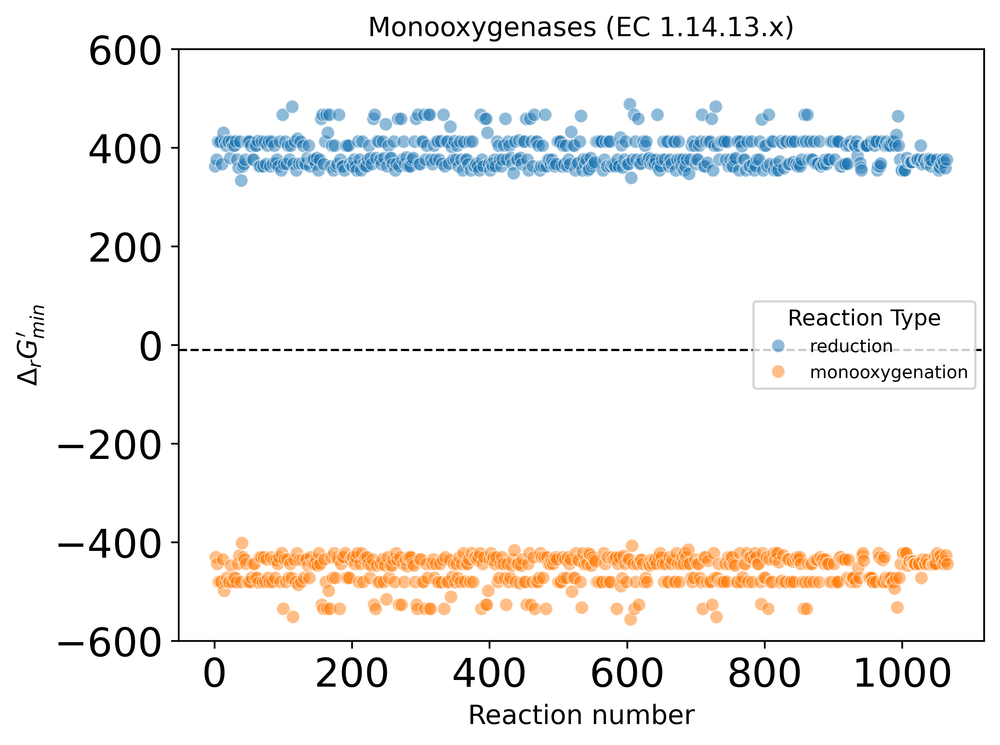

In [48]:
sns.scatterplot(x = reaction_number_jittered, y = dG_min_vals, hue = rule_type, alpha=0.5)

plt.title('Monooxygenases (EC 1.14.13.x)', fontsize=12)
plt.xlabel('Reaction number', fontsize=12)
plt.ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize=12)
plt.ylim([-600, 600])
plt.axhline(y = -10, color = 'k', linestyle = 'dashed', linewidth = 1)

plt.legend(title = 'Reaction Type', fontsize = 8)
plt.show()

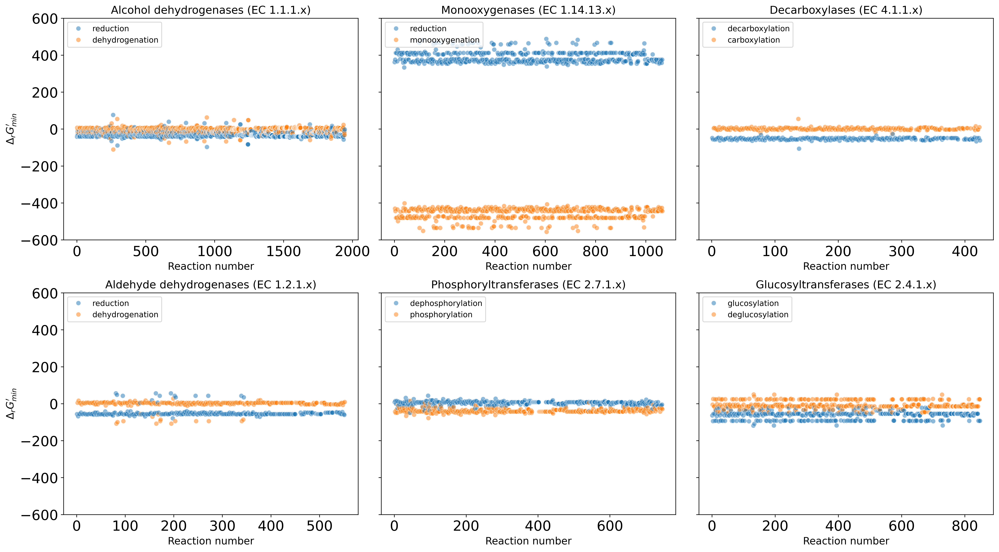

In [49]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10), sharey=True)
subplot_title_fontsize = 14
subplot_x_label_fontsize = 13
subplot_y_label_fontsize = 13

### Top leftmost subplot
# Alcohol dehydrogenases
query_rules = ['rule0002','rule0003']
dG_min_vals, reaction_number_jittered, rule_type = get_MDF_vals( query_rules, ['dehydrogenation','reduction'], all_processed_rxns_w_thermo)

sns.scatterplot(x = reaction_number_jittered, y = dG_min_vals, hue = rule_type, alpha=0.5, ax = axs[0,0])
axs[0,0].set_ylim([-600, 600])
axs[0,0].set_title('Alcohol dehydrogenases (EC 1.1.1.x)', fontsize = subplot_title_fontsize)
axs[0,0].set_xlabel('Reaction number', fontsize = subplot_x_label_fontsize)
axs[0,0].set_ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize = subplot_y_label_fontsize)
axs[0,0].legend(loc='upper left', bbox_to_anchor=(0, 1))

### Middle subplot of top row
# Monooxygenases
query_rules = ['rule0004','rule0005']
dG_min_vals, reaction_number_jittered, rule_type = get_MDF_vals( query_rules, ['monooxygenation','reduction'], all_processed_rxns_w_thermo)

sns.scatterplot(x = reaction_number_jittered, y = dG_min_vals, hue = rule_type, alpha=0.5, ax = axs[0,1])
axs[0,1].set_ylim([-600, 600])
axs[0,1].set_title('Monooxygenases (EC 1.14.13.x)', fontsize = subplot_title_fontsize)
axs[0,1].set_xlabel('Reaction number', fontsize = subplot_x_label_fontsize)
axs[0,1].set_ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize = subplot_y_label_fontsize)
axs[0,1].legend(loc='upper left', bbox_to_anchor=(0, 1))

### Top rightmost subplot
# Decarboxylases
query_rules = ['rule0023','rule0024']
dG_min_vals, reaction_number_jittered, rule_type = get_MDF_vals( query_rules, ['carboxylation','decarboxylation'], all_processed_rxns_w_thermo)

sns.scatterplot(x = reaction_number_jittered, y = dG_min_vals, hue = rule_type, alpha=0.5, ax = axs[0,2])
axs[0,2].set_ylim([-600, 600])
axs[0,2].set_title('Decarboxylases (EC 4.1.1.x)', fontsize = subplot_title_fontsize)
axs[0,2].set_xlabel('Reaction number', fontsize = subplot_x_label_fontsize)
axs[0,2].set_ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize = subplot_y_label_fontsize)
axs[0,2].legend(loc='upper left', bbox_to_anchor=(0, 1))

### Bottom left subplot
# aldehyde dehydrogenases
query_rules = ['rule0025','rule0026']
dG_min_vals, reaction_number_jittered, rule_type = get_MDF_vals( query_rules, ['dehydrogenation','reduction'], all_processed_rxns_w_thermo)

sns.scatterplot(x = reaction_number_jittered, y = dG_min_vals, hue = rule_type, alpha=0.5, ax = axs[1,0])
axs[1,0].set_ylim([-600, 600])
axs[1,0].set_title('Aldehyde dehydrogenases (EC 1.2.1.x)', fontsize = subplot_title_fontsize)
axs[1,0].set_xlabel('Reaction number', fontsize = subplot_x_label_fontsize)
axs[1,0].set_ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize = subplot_y_label_fontsize)
axs[1,0].legend(loc='upper left', bbox_to_anchor=(0, 1))

### Bottom middle subplot
# phosphoryltransferases
query_rules = ['rule0014','rule0015']
dG_min_vals, reaction_number_jittered, rule_type = get_MDF_vals( query_rules, ['dephosphorylation','phosphorylation'], all_processed_rxns_w_thermo)

sns.scatterplot(x = reaction_number_jittered, y = dG_min_vals, hue = rule_type, alpha=0.5, ax = axs[1,1])
axs[1,1].set_ylim([-600, 600])
axs[1,1].set_title('Phosphoryltransferases (EC 2.7.1.x)', fontsize = subplot_title_fontsize)
axs[1,1].set_xlabel('Reaction number', fontsize = subplot_x_label_fontsize)
axs[1,1].set_ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize = subplot_y_label_fontsize)
axs[1,1].legend(loc='upper left', bbox_to_anchor=(0, 1))

### Bottom right subplot
# phosphoryltransferases
query_rules = ['rule0008','rule0009']
dG_min_vals, reaction_number_jittered, rule_type = get_MDF_vals( query_rules, ['deglucosylation','glucosylation'], all_processed_rxns_w_thermo)

sns.scatterplot(x = reaction_number_jittered, y = dG_min_vals, hue = rule_type, alpha=0.5, ax = axs[1,2])
axs[1,2].set_ylim([-600, 600])
axs[1,2].set_title('Glucosyltransferases (EC 2.4.1.x)', fontsize = subplot_title_fontsize)
axs[1,2].set_xlabel('Reaction number', fontsize = subplot_x_label_fontsize)
axs[1,2].set_ylabel(r'$\Delta_{r}G_{min}^{\prime}$', fontsize = subplot_y_label_fontsize)
axs[1,2].legend(loc='upper left', bbox_to_anchor=(0, 1));
plt.savefig('SI_fig5.png')
plt.show()

### <a id="section_6"></a>Investigating the breakdown of thermodynamically eligible/ ineligible reactions within various classes of reactions (SI figure)

In [50]:
def get_thermo_counts(query_rule, all_processed_rxns_w_thermo):
    
    # Counter to track reactions under this query rule/s for which no thermo calculations were attempted
    rxns_without_cpd_accession_IDs_count = 0
    
    # counter to track reactions under this query rule/s for which thermo thermo calculations have high error
    rxns_with_high_thermo_uncertainty_count = 0
    
    # counter to track reactions under this query rule/s that are actually eligible for model training
    rxns_elibible_for_tranining_count = 0
    
    total_count = 0
    
    # for each reaction
    for rxn in all_processed_rxns_w_thermo:
        
        # if the mapped rule is that of the query rule
        if rxn['Rule'] in query_rule:
        
            # first tally reactions for which no thermodynamic values exist
            if rxn['Reaction eq in accession IDs'] is None:
                rxns_without_cpd_accession_IDs_count += 1

            # then consider reactions for which thermodynamic values do exist
            else:
                assert rxn['Reaction eq in accession IDs'] is not None
                assert rxn['Standard dG'] is not None
                assert rxn['Standard dG error'] is not None
                assert rxn['Physiological dG'] is not None
                assert rxn['Physiological dG error'] is not None
                
                # amongst these, tally rxns with high thermodynamic uncertainties
                if rxn['Physiological dG error'] > 9999 and rxn['Standard dG error'] > 9999:
                    rxns_with_high_thermo_uncertainty_count += 1
                    
                else:
                    rxns_elibible_for_tranining_count += 1
                    
        
    return rxns_without_cpd_accession_IDs_count, rxns_with_high_thermo_uncertainty_count, rxns_elibible_for_tranining_count

#### Here, we plot for six different classes of enzymatic reactions, how the number of reactions that have no thermodynamic values at all compares to the number of reactions that do have thermodynamic values but with high uncertainties as well as how both of these compare to the number of reactions that can actually be used for model training.

Text(0, 0.5, 'Count')

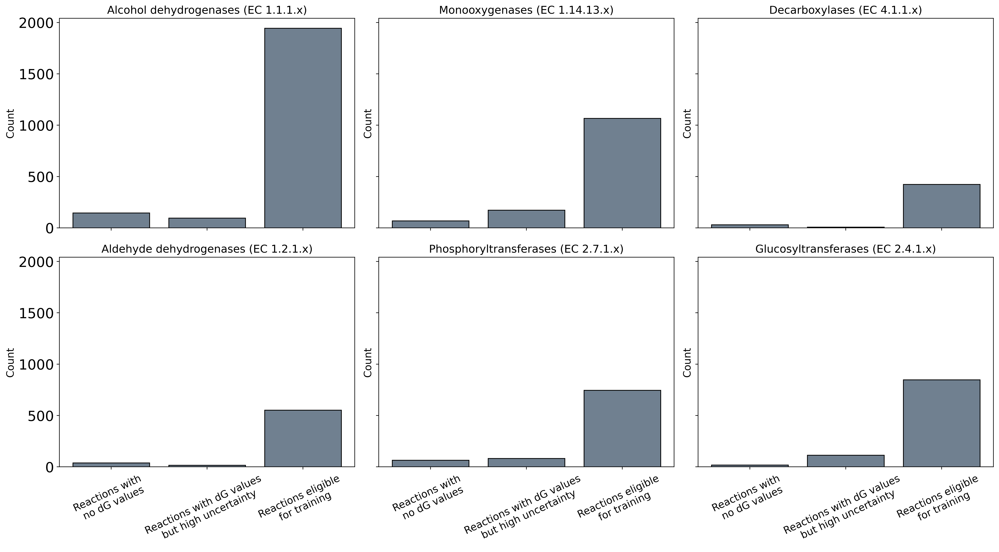

In [51]:
# Set up the subplot grid
fig, axs = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
fontsize = 18
legend_loc = 'upper left'
legend_fontsize=11

# Define the x labels for each subplot
x_labels = ['Reactions with \nno dG values', 
            'Reactions with dG values \nbut high uncertainty', 
            'Reactions eligible \nfor training'] 


x_ticks_fontsize = 13
y_label_fontsize = 13
subplot_title_fontsize = 14

### Top leftmost subplot
# Alcohol dehydrogenases
query_rules = ['rule0002','rule0003']
rxns_without_cpd_accession_IDs_count, rxns_with_high_thermo_uncertainty_count, rxns_elibible_for_tranining_count = get_thermo_counts(query_rules, all_processed_rxns_w_thermo)

y_values = [rxns_without_cpd_accession_IDs_count, 
            rxns_with_high_thermo_uncertainty_count, 
            rxns_elibible_for_tranining_count]

axs[0,0].set_title('Alcohol dehydrogenases (EC 1.1.1.x)',fontsize = subplot_title_fontsize)
axs[0,0].bar(x_labels, y_values, color='slategrey', edgecolor='k')
axs[0,0].set_xticks(range(len(x_labels)))  
axs[0,0].set_xticklabels(x_labels, fontsize = x_ticks_fontsize, rotation=25)
axs[0,0].set_ylabel('Count', fontsize = y_label_fontsize)

### Middle subplot of top row
# Monooxygenases
query_rules = ['rule0004','rule0005']
rxns_without_cpd_accession_IDs_count, rxns_with_high_thermo_uncertainty_count, rxns_elibible_for_tranining_count = get_thermo_counts(query_rules, all_processed_rxns_w_thermo)

y_values = [rxns_without_cpd_accession_IDs_count, 
            rxns_with_high_thermo_uncertainty_count, 
            rxns_elibible_for_tranining_count]

axs[0,1].set_title('Monooxygenases (EC 1.14.13.x)',fontsize = subplot_title_fontsize)
axs[0,1].bar(x_labels, y_values, color='slategrey', edgecolor='k')
axs[0,1].set_xticks(range(len(x_labels)))  
axs[0,1].set_xticklabels(x_labels, fontsize = x_ticks_fontsize, rotation=25) 
axs[0,1].set_ylabel('Count', fontsize = y_label_fontsize)

### Top rightmost subplot
# Decarboxylases
query_rules = ['rule0023','rule0024']
rxns_without_cpd_accession_IDs_count, rxns_with_high_thermo_uncertainty_count, rxns_elibible_for_tranining_count = get_thermo_counts(query_rules, all_processed_rxns_w_thermo)

y_values = [rxns_without_cpd_accession_IDs_count, 
            rxns_with_high_thermo_uncertainty_count, 
            rxns_elibible_for_tranining_count]

axs[0,2].set_title('Decarboxylases (EC 4.1.1.x)',fontsize = subplot_title_fontsize)
axs[0,2].bar(x_labels, y_values, color='slategrey', edgecolor='k')
axs[0,2].set_xticks(range(len(x_labels)))  
axs[0,2].set_xticklabels(x_labels, fontsize = x_ticks_fontsize, rotation=25) 
axs[0,2].set_ylabel('Count', fontsize = y_label_fontsize)

### Bottom left subplot
# aldehyde dehydrogenases
query_rules = ['rule0025','rule0026']
rxns_without_cpd_accession_IDs_count, rxns_with_high_thermo_uncertainty_count, rxns_elibible_for_tranining_count = get_thermo_counts(query_rules, all_processed_rxns_w_thermo)

y_values = [rxns_without_cpd_accession_IDs_count, 
            rxns_with_high_thermo_uncertainty_count, 
            rxns_elibible_for_tranining_count]

axs[1,0].set_title('Aldehyde dehydrogenases (EC 1.2.1.x)',fontsize = subplot_title_fontsize)
axs[1,0].bar(x_labels, y_values, color='slategrey', edgecolor='k')
axs[1,0].set_xticks(range(len(x_labels)))  
axs[1,0].set_xticklabels(x_labels, fontsize = x_ticks_fontsize, rotation=25) 
axs[1,0].set_ylabel('Count', fontsize = y_label_fontsize)

### Bottom middle subplot
# phosphoryltransferases
query_rules = ['rule0014','rule0015']
rxns_without_cpd_accession_IDs_count, rxns_with_high_thermo_uncertainty_count, rxns_elibible_for_tranining_count = get_thermo_counts(query_rules, all_processed_rxns_w_thermo)

y_values = [rxns_without_cpd_accession_IDs_count, 
            rxns_with_high_thermo_uncertainty_count, 
            rxns_elibible_for_tranining_count]

axs[1,1].set_title('Phosphoryltransferases (EC 2.7.1.x)',fontsize = subplot_title_fontsize)
axs[1,1].bar(x_labels, y_values, color='slategrey', edgecolor='k')
axs[1,1].set_xticks(range(len(x_labels)))  
axs[1,1].set_xticklabels(x_labels, fontsize = x_ticks_fontsize, rotation=25) 
axs[1,1].set_ylabel('Count', fontsize = y_label_fontsize)

### Bottom right subplot
# phosphoryltransferases
query_rules = ['rule0008','rule0009']
rxns_without_cpd_accession_IDs_count, rxns_with_high_thermo_uncertainty_count, rxns_elibible_for_tranining_count = get_thermo_counts(query_rules, all_processed_rxns_w_thermo)

y_values = [rxns_without_cpd_accession_IDs_count, 
            rxns_with_high_thermo_uncertainty_count, 
            rxns_elibible_for_tranining_count]

axs[1,2].set_title('Glucosyltransferases (EC 2.4.1.x)',fontsize = subplot_title_fontsize)
axs[1,2].bar(x_labels, y_values, color='slategrey', edgecolor='k')
axs[1,2].set_xticks(range(len(x_labels)))  
axs[1,2].set_xticklabels(x_labels, fontsize = x_ticks_fontsize, rotation=25) 
axs[1,2].set_ylabel('Count', fontsize = y_label_fontsize)